###OD and OC as a single class

---



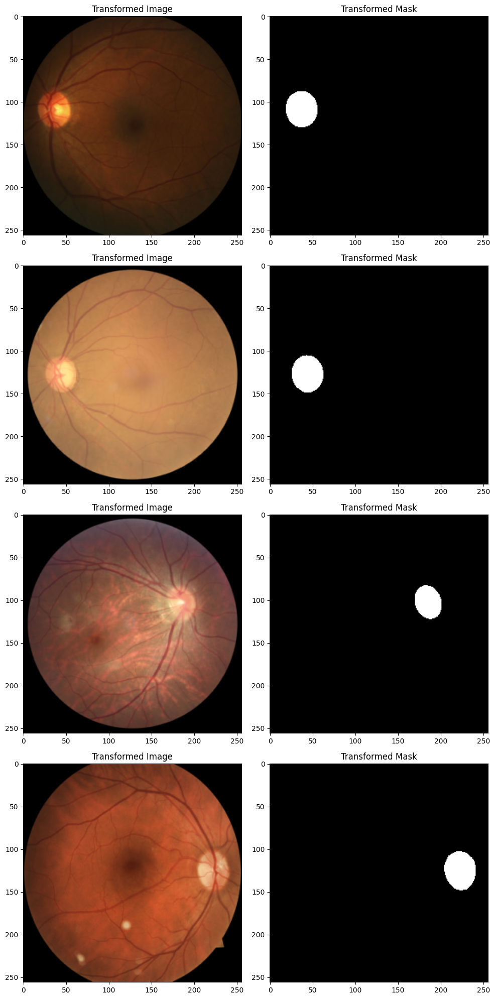

In [3]:
import os
import numpy as np
from PIL import Image, ImageOps
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2
from torchvision.transforms import Resize, ToTensor, Normalize, Compose, RandomHorizontalFlip, RandomVerticalFlip, ColorJitter, RandomRotation
from torchvision.transforms.functional import hflip, vflip, rotate
import random
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import transforms
import torch.nn.functional as F
# Dataset class for OD and OC detection
class GlaucomaDataset(Dataset):
    def __init__(self, image_paths, mask_paths, output_size=(256, 256), augmentation=True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.output_size = output_size
        self.augmentation = augmentation
        self.transform = Compose([
            Resize(output_size),  # Resize the image to the output size
            ToTensor(),
            Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        self.mask_transform = Compose([
            Resize(output_size, interpolation=Image.NEAREST),  # Ensure masks are resized the same way
            ToTensor()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx])
        mask = Image.open(self.mask_paths[idx]).convert('L')

        if self.augmentation:
            # Augment both image and mask the same way
            if random.random() > 0.5:
                angle = random.randint(-30, 30)
                img = rotate(img, angle)
                mask = rotate(mask, angle)
            if random.random() > 0.5:
                img = hflip(img)
                mask = hflip(mask)
            if random.random() > 0.5:
                img = vflip(img)
                mask = vflip(mask)

        img = self.transform(img)
        mask = self.mask_transform(mask)
        mask = (mask > 0).type(torch.int64).squeeze()  # Combine OD and OC as single class
        return img, mask


# Load Data function
def load_data(data_folder):
    image_dir = os.path.join(data_folder, 'Images')
    mask_dir = os.path.join(data_folder, 'Masks')

    image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir)]
    mask_paths = [os.path.join(mask_dir, f) for f in os.listdir(mask_dir)]

    train_img_paths, test_img_paths, train_mask_paths, test_mask_paths = train_test_split(
        image_paths, mask_paths, test_size=0.2, random_state=42)

    val_img_paths, test_img_paths, val_mask_paths, test_mask_paths = train_test_split(
        test_img_paths, test_mask_paths, test_size=0.5, random_state=42)

    return train_img_paths, val_img_paths, test_img_paths, train_mask_paths, val_mask_paths, test_mask_paths


# Load the data
data_folder = r'C:\Users\jadku\Documents\Applied Machine Learning\data'
train_img_paths, val_img_paths, test_img_paths, train_mask_paths, val_mask_paths, test_mask_paths = load_data(data_folder)

# Create dataset objects
train_dataset = GlaucomaDataset(train_img_paths, train_mask_paths)
val_dataset = GlaucomaDataset(val_img_paths, val_mask_paths)
test_dataset = GlaucomaDataset(test_img_paths, test_mask_paths)
batch_size = 8
# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


def show_transformed_images(dataset, idx_list):
    fig, axes = plt.subplots(len(idx_list), 2, figsize=(10, len(idx_list) * 5))
    for i, idx in enumerate(idx_list):
        image, mask = dataset[idx]

        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0, 1)

        mask = mask.numpy().squeeze()  # Squeeze the mask to remove the single-channel dimension

        ax_image = axes[i, 0]
        ax_mask = axes[i, 1]

        ax_image.imshow(image)
        ax_image.set_title('Transformed Image')

        ax_mask.imshow(mask, cmap='gray')  # Display the mask as grayscale
        ax_mask.set_title('Transformed Mask')

    plt.tight_layout()
    plt.show()



# visualize four transformed samples after preprocessing
show_transformed_images(train_dataset, [0, 60, 600, 100])

In [4]:

# The U-Net model architecture
class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=2):
        super(UNet, self).__init__()

        self.conv11 = nn.Conv2d(n_channels, 64, 3, padding=1)
        self.conv12 = nn.Conv2d(64,64,3,padding=1)
        self.conv13 = nn.Conv2d(64,64,3,padding=1)

        self.conv21 = nn.Conv2d(64,128,3,padding=1)
        self.conv22 = nn.Conv2d(128,128,3,padding=1)
        self.conv23 = nn.Conv2d(128,128,3,padding=1)

        self.conv31 = nn.Conv2d(128,256,3,padding=1)
        self.conv32 = nn.Conv2d(256,256,3,padding=1)
        self.conv33 = nn.Conv2d(256,256,3,padding=1)

        self.conv41 = nn.Conv2d(256,512,3,padding=1)
        self.conv42 = nn.Conv2d(512,512,3,padding=1)
        self.conv43 = nn.Conv2d(512,512,3,padding=1)

        self.conv51 = nn.Conv2d(512,1024,3,padding=1)
        self.conv52 = nn.Conv2d(1024,1024,3,padding=1)
        self.conv53 = nn.Conv2d(1024,1024,3,padding=1)

        self.deconv1 = nn.ConvTranspose2d(1024+512,512,2,2)
        self.conv61 = nn.Conv2d(512,512,3,padding=1)
        self.conv62 = nn.Conv2d(512,512,3,padding=1)

        self.deconv2 = nn.ConvTranspose2d(512+256,256,2,2)
        self.conv71 = nn.Conv2d(256,256,3,padding=1)
        self.conv72 = nn.Conv2d(256,256,3,padding=1)

        self.deconv3 = nn.ConvTranspose2d(256+128,128,2,2)
        self.conv81 = nn.Conv2d(128,128,3,padding=1)
        self.conv82 = nn.Conv2d(128,128,3,padding=1)

        self.deconv4 = nn.ConvTranspose2d(128+64,64,2,2)
        self.conv91 = nn.Conv2d(64,64,3,padding=1)
        self.conv92 = nn.Conv2d(64,64,3,padding=1)

        self.conv10 = nn.Conv2d(64, n_classes, 1, 1)


        self.bn11 = nn.BatchNorm2d(64)
        self.bn12 = nn.BatchNorm2d(64)
        self.bn13 = nn.BatchNorm2d(64)

        self.bn21 = nn.BatchNorm2d(128)
        self.bn22 = nn.BatchNorm2d(128)
        self.bn23 = nn.BatchNorm2d(128)

        self.bn31 = nn.BatchNorm2d(256)
        self.bn32 = nn.BatchNorm2d(256)
        self.bn33 = nn.BatchNorm2d(256)

        self.bn41 = nn.BatchNorm2d(512)
        self.bn42 = nn.BatchNorm2d(512)
        self.bn43 = nn.BatchNorm2d(512)

        self.bn51 = nn.BatchNorm2d(1024)
        self.bn52 = nn.BatchNorm2d(1024)
        self.bn53 = nn.BatchNorm2d(1024)

        self.bn61 = nn.BatchNorm2d(512)
        self.bn62 = nn.BatchNorm2d(512)
        self.bnde1 = nn.BatchNorm2d(512)

        self.bn71 = nn.BatchNorm2d(256)
        self.bn72 = nn.BatchNorm2d(256)
        self.bnde2 = nn.BatchNorm2d(256)

        self.bn81 = nn.BatchNorm2d(128)
        self.bn82 = nn.BatchNorm2d(128)
        self.bnde3 = nn.BatchNorm2d(128)

        self.bn91 = nn.BatchNorm2d(64)
        self.bn92 = nn.BatchNorm2d(64)
        self.bnde4 = nn.BatchNorm2d(64)

        self.pool1 = nn.MaxPool2d(2,2)
        self.pool2 = nn.MaxPool2d(2,2)
        self.pool3 = nn.MaxPool2d(2,2)
        self.pool4 = nn.MaxPool2d(2,2)

        self.softmax = nn.Softmax(dim=1)

    def forward(self,x):
        # block1
        h = F.relu(self.bn11(self.conv11(x)))
        h = F.relu(self.bn12(self.conv12(h)))
        h = F.relu(self.bn13(self.conv13(h)))
        h1 = self.pool1(h)

        # block2
        h = F.relu(self.bn21(self.conv21(h1)))
        h = F.relu(self.bn22(self.conv22(h)))
        h = F.relu(self.bn23(self.conv23(h)))
        h2 = self.pool2(h)

        # block3
        h = F.relu(self.bn31(self.conv31(h2)))
        h = F.relu(self.bn32(self.conv32(h)))
        h = F.relu(self.bn33(self.conv33(h)))
        h3 = self.pool3(h)

        # block4
        h = F.relu(self.bn41(self.conv41(h3)))
        h = F.relu(self.bn42(self.conv42(h)))
        h = F.relu(self.bn43(self.conv43(h)))
        h4 = self.pool4(h)

        # block5
        h = F.relu(self.bn51(self.conv51(h4)))
        h = F.relu(self.bn52(self.conv52(h)))
        h = F.relu(self.bn53(self.conv53(h)))

        # block 6
        h = torch.cat((h,h4),1)
        h = F.relu(self.bnde1(self.deconv1(h)))
        h = F.relu(self.bn61(self.conv61(h)))
        h = F.relu(self.bn62(self.conv62(h)))

        # block 7
        h = torch.cat((h,h3),1)
        h = F.relu(self.bnde2(self.deconv2(h)))
        h = F.relu(self.bn71(self.conv71(h)))
        h = F.relu(self.bn72(self.conv72(h)))

        # block 8
        h = torch.cat((h,h2),1)
        h = F.relu(self.bnde3(self.deconv3(h)))
        h = F.relu(self.bn81(self.conv81(h)))
        h = F.relu(self.bn82(self.conv82(h)))

        # block 9
        h = torch.cat((h,h1),1)
        h = F.relu(self.bnde4(self.deconv4(h)))
        h = F.relu(self.bn91(self.conv91(h)))
        h = F.relu(self.bn92(self.conv92(h)))

        h = self.conv10(h)

        return h

#Dice score

class MultiClassDiceScore(nn.Module):
    def forward(self, inputs, targets, smooth=1):
        inputs = F.softmax(inputs, dim=1)
        dice_scores = []
        input_flat = (inputs[:, 1, :, :] > 0.5).view(-1).float()  # Only for OD
        target_flat = (targets == 1).view(-1).float()  # Only for OD
        intersection = (input_flat * target_flat).sum()
        dice_score = (2. * intersection + smooth) / (input_flat.sum() + target_flat.sum() + smooth)
        dice_scores.append(dice_score)
        return sum(dice_scores) / len(dice_scores)

class ValMultiClassDiceScore(nn.Module):
    def forward(self, inputs, targets, smooth=1):
        inputs = F.softmax(inputs, dim=1)
        dice_scores = []
        for class_index in range(1, inputs.shape[1]):  # 0 is the background
            input_flat = (inputs[:, class_index, :, :] > 0.5).view(-1).float()
            target_flat = (targets == class_index).view(-1).float()
            intersection = (input_flat * target_flat).sum()
            dice_score = (2. * intersection + smooth) / (input_flat.sum() + target_flat.sum() + smooth)
            dice_scores.append(dice_score)

        return sum(dice_scores) / len(dice_scores)
# Combined dice + cross entropy loss to handel multi class
class CombinedDiceCELoss(nn.Module):
    def __init__(self, dice_weight=0.5):
        super(CombinedDiceCELoss, self).__init__()
        self.dice_weight = dice_weight
        self.ce_loss = nn.CrossEntropyLoss()  # Cross-entropy for multi-class
        self.dice_loss = MultiClassDiceScore()

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        dice_loss = 1 - self.dice_loss(inputs, targets)
        combined_loss = self.dice_weight * dice_loss + (1 - self.dice_weight) * ce_loss
        return combined_loss

# training function
def train_one_epoch(model, train_loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for i, (images, masks) in enumerate(train_loader):
        images = images.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    return running_loss / len(train_loader)

def validate_model(model, val_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    dice_score = 0.0
    dice_scorer = ValMultiClassDiceScore().to(device)
    for i, (images, masks) in enumerate(val_loader):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = criterion(outputs, masks)
        running_loss += loss.item()
        dice_score += dice_scorer(outputs, masks).item()
    average_loss = running_loss / len(val_loader)
    average_dice = dice_score / len(val_loader)
    return average_loss, average_dice



In [3]:
# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=3, n_classes=2).to(device)

# SGD optimizer and a learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2,factor=0.1)
criterion = nn.CrossEntropyLoss().to(device)
num_epochs = 200
best_dice_score = 0.0
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
print('training started...')
# Training and validation loop
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_dice_score = validate_model(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Early stopping
    if val_dice_score > best_dice_score:
        best_dice_score = val_dice_score
        best_loss = val_loss
        torch.save(model.state_dict(), 'OD_OC_single_class_best_model.pth')
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f} (improved)")
        patience_counter = 0
    else:
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f}")
        patience_counter += 1

    if patience_counter >= patience:
            print("Early stopping triggered due to no improvement in validation dice score.")
            break

training started...
Epoch 1: Training Loss 0.038448, Validation Loss 0.018835, Dice Score 0.781479 (improved)
Epoch 2: Training Loss 0.012257, Validation Loss 0.011205, Dice Score 0.887190 (improved)
Epoch 3: Training Loss 0.010517, Validation Loss 0.011961, Dice Score 0.882127
Epoch 4: Training Loss 0.009556, Validation Loss 0.009736, Dice Score 0.901599 (improved)
Epoch 5: Training Loss 0.008278, Validation Loss 0.009495, Dice Score 0.906032 (improved)
Epoch 6: Training Loss 0.007878, Validation Loss 0.008575, Dice Score 0.910602 (improved)
Epoch 7: Training Loss 0.007412, Validation Loss 0.007697, Dice Score 0.921504 (improved)
Epoch 8: Training Loss 0.006855, Validation Loss 0.007393, Dice Score 0.926457 (improved)
Epoch 9: Training Loss 0.006662, Validation Loss 0.007163, Dice Score 0.924695
Epoch 10: Training Loss 0.006402, Validation Loss 0.007445, Dice Score 0.923639
Epoch 11: Training Loss 0.005969, Validation Loss 0.006642, Dice Score 0.927761 (improved)
Epoch 12: Training Lo

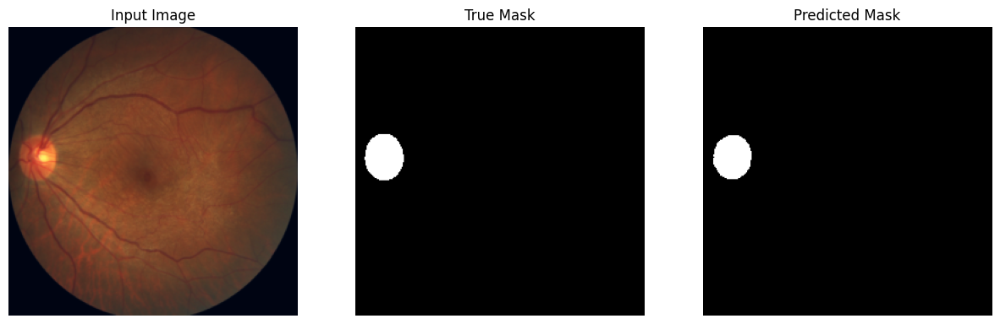

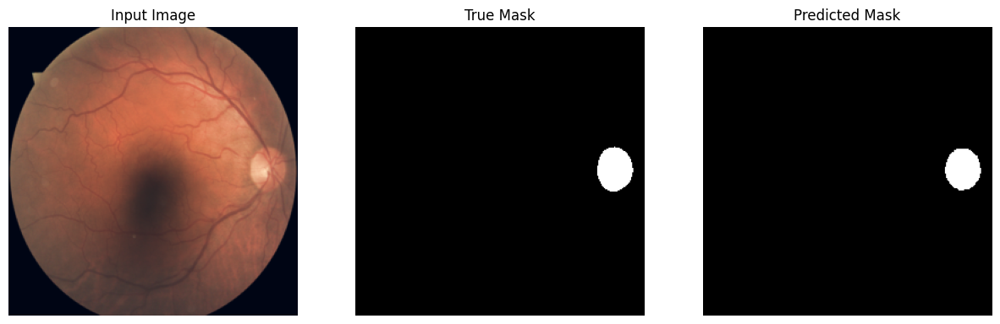

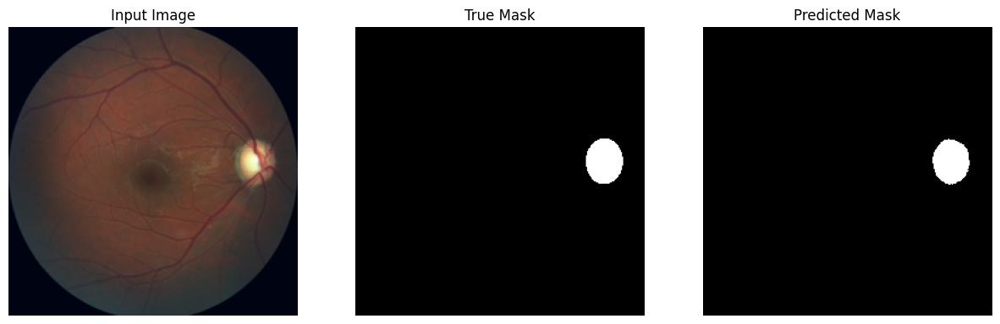

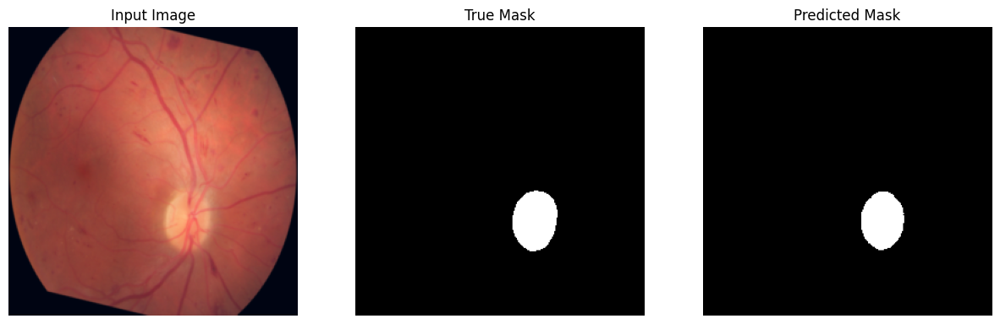

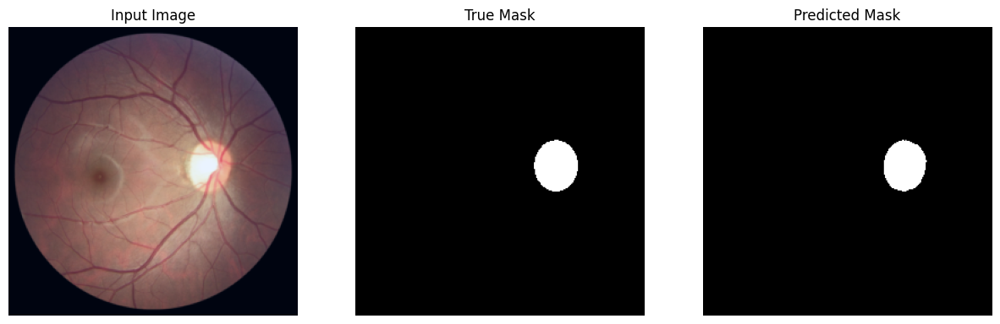

...

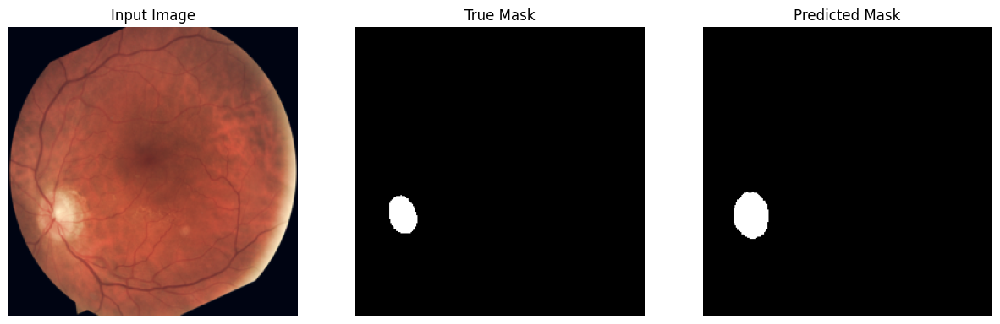

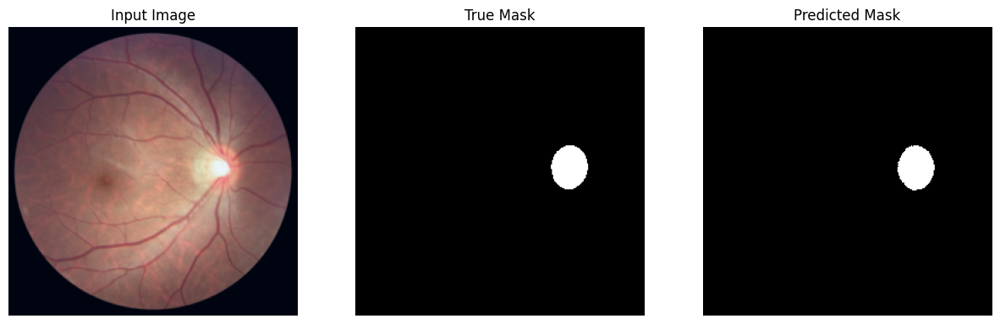

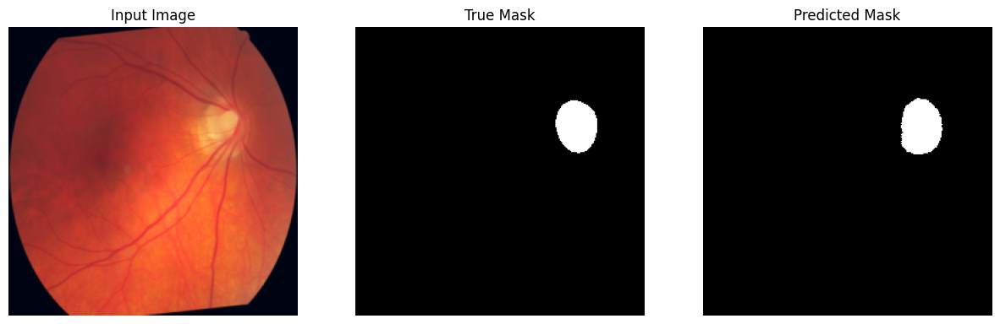

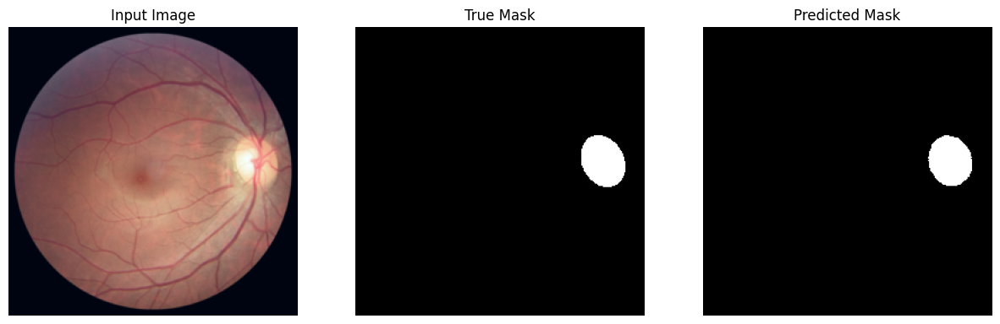

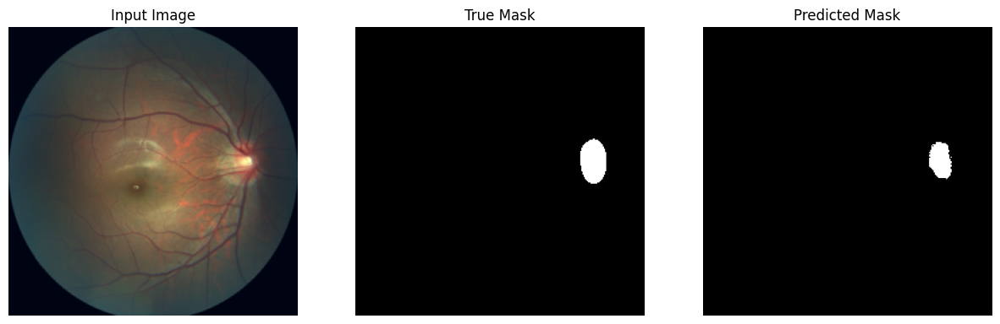

Average Dice Coefficient: 0.9425


In [13]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F

class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice

def visualize(image, mask, prediction):
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
    mask_np = mask.cpu().numpy()
    prediction_np = prediction.cpu().numpy()
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title('True Mask')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(prediction_np, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Initialize the model
model = UNet(n_channels=3, n_classes=2)
model_load_path = 'OD_OC_single_class_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
model.eval()
model = model.to(device)

dice_scorer = DiceScoreCoefficient().to(device)
total_dice_coefficient = 0.0
count = 0

for images, masks in test_loader:
    images = images.to(device)
    masks = masks.to(device)
    masks = (masks).float()  # Combine OC and OD into one class

    with torch.no_grad():
        outputs = model(images)
        probabilities = F.softmax(outputs, dim=1)
        preds = probabilities.argmax(dim=1)
        preds = (preds).float()  # Convert to binary predictions

        dice_coef = dice_scorer(preds, masks)
        total_dice_coefficient += dice_coef.item()
        count += 1

        if count in [1, 2]:  # Visualize the first 2 batches
            for i in range(images.size(0)):
                visualize(images[i], masks[i], preds[i])

if count > 0:
    average_dice = total_dice_coefficient / count
    print(f'Average Dice Coefficient: {average_dice:.4f}')
else:
    print("No data to process.")


###Extra credit: Seperate Models to detect OD and OC seperatly using the same hyperparamters from the last task to check which method is better

---



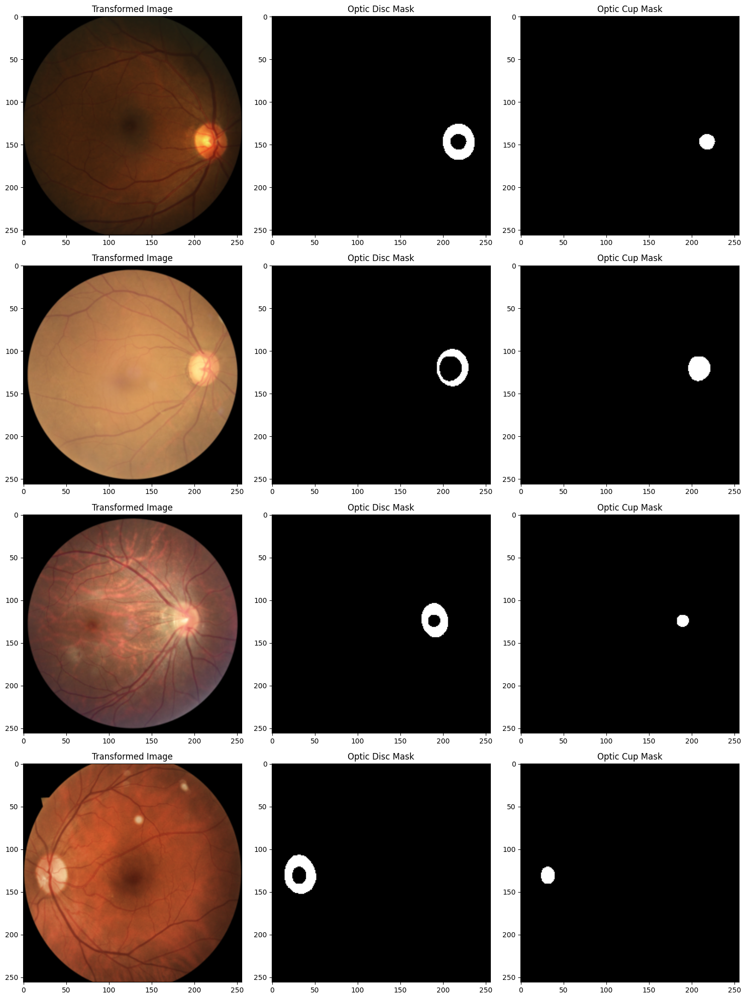

In [50]:
import os
import numpy as np
from PIL import Image, ImageOps
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2
from torchvision.transforms import Resize, ToTensor, Normalize, Compose, RandomHorizontalFlip, RandomVerticalFlip, ColorJitter, RandomRotation
from torchvision.transforms.functional import hflip, vflip, rotate
import random
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import transforms
import torch.nn.functional as F
# Dataset class for OD and OC detection
class GlaucomaDataset(Dataset):
    def __init__(self, image_paths, mask_paths, output_size=(256, 256), augmentation=True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.output_size = output_size
        self.augmentation = augmentation
        self.transform = Compose([
            Resize(output_size),
            ToTensor(),
            Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        self.mask_transform = Compose([
            Resize(output_size, interpolation=Image.NEAREST),
            ToTensor()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx])
        mask = Image.open(self.mask_paths[idx]).convert('L')

        if self.augmentation:
            if random.random() > 0.5:
                angle = random.randint(-30, 30)
                img = rotate(img, angle)
                mask = rotate(mask, angle)
            if random.random() > 0.5:
                img = hflip(img)
                mask = hflip(mask)
            if random.random() > 0.5:
                img = vflip(img)
                mask = vflip(mask)
        mask = mask.resize(self.output_size, Image.NEAREST)
        mask_np = np.array(mask)
        mask_od = np.zeros_like(mask_np, dtype=np.int64)
        mask_oc = np.zeros_like(mask_np, dtype=np.int64)

        # Assigning each mask
        mask_od[mask_np == 1] = 1  # OD
        mask_oc[mask_np == 2] = 1  # OC

        img = self.transform(img)
        mask_od = torch.from_numpy(mask_od).long()
        mask_oc = torch.from_numpy(mask_oc).long()
        return img, mask_od, mask_oc
# Load Data function
def load_data(data_folder):
    image_dir = os.path.join(data_folder, 'Images')
    mask_dir = os.path.join(data_folder, 'Masks')

    image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir)]
    mask_paths = [os.path.join(mask_dir, f) for f in os.listdir(mask_dir)]

    train_img_paths, test_img_paths, train_mask_paths, test_mask_paths = train_test_split(
        image_paths, mask_paths, test_size=0.2, random_state=42)

    val_img_paths, test_img_paths, val_mask_paths, test_mask_paths = train_test_split(
        test_img_paths, test_mask_paths, test_size=0.5, random_state=42)

    return train_img_paths, val_img_paths, test_img_paths, train_mask_paths, val_mask_paths, test_mask_paths


# Load the data
data_folder = r'C:\Users\jadku\Documents\Applied Machine Learning\data'
train_img_paths, val_img_paths, test_img_paths, train_mask_paths, val_mask_paths, test_mask_paths = load_data(data_folder)

# Create dataset objects
train_dataset = GlaucomaDataset(train_img_paths, train_mask_paths)
val_dataset = GlaucomaDataset(val_img_paths, val_mask_paths)
test_dataset = GlaucomaDataset(test_img_paths, test_mask_paths)
batch_size = 8
# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)


def show_transformed_images(dataset, idx_list):
    fig, axes = plt.subplots(len(idx_list), 3, figsize=(15, len(idx_list) * 5))  # Changed from 2 to 3 columns for images
    for i, idx in enumerate(idx_list):
        image, mask_od, mask_oc = dataset[idx]  # Updated to handle three returned items

        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0, 1)

        mask_od = mask_od.numpy()
        mask_oc = mask_oc.numpy()
        ax_image = axes[i, 0]
        ax_mask_od = axes[i, 1]
        ax_mask_oc = axes[i, 2]

        ax_image.imshow(image)
        ax_image.set_title('Transformed Image')
        ax_mask_od.imshow(mask_od, cmap='gray', vmin=0, vmax=1)
        ax_mask_od.set_title('Optic Disc Mask')
        ax_mask_oc.imshow(mask_oc, cmap='gray', vmin=0, vmax=1)
        ax_mask_oc.set_title('Optic Cup Mask')

    plt.tight_layout()
    plt.show()

# Visualize four transformed samples after preprocessing
show_transformed_images(train_dataset, [0, 60, 600, 100])


In [43]:
# The U-Net model architecture
class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=3):
        super(UNet, self).__init__()

        self.conv11 = nn.Conv2d(n_channels, 64, 3, padding=1)
        self.conv12 = nn.Conv2d(64,64,3,padding=1)
        self.conv13 = nn.Conv2d(64,64,3,padding=1)

        self.conv21 = nn.Conv2d(64,128,3,padding=1)
        self.conv22 = nn.Conv2d(128,128,3,padding=1)
        self.conv23 = nn.Conv2d(128,128,3,padding=1)

        self.conv31 = nn.Conv2d(128,256,3,padding=1)
        self.conv32 = nn.Conv2d(256,256,3,padding=1)
        self.conv33 = nn.Conv2d(256,256,3,padding=1)

        self.conv41 = nn.Conv2d(256,512,3,padding=1)
        self.conv42 = nn.Conv2d(512,512,3,padding=1)
        self.conv43 = nn.Conv2d(512,512,3,padding=1)

        self.conv51 = nn.Conv2d(512,1024,3,padding=1)
        self.conv52 = nn.Conv2d(1024,1024,3,padding=1)
        self.conv53 = nn.Conv2d(1024,1024,3,padding=1)

        self.deconv1 = nn.ConvTranspose2d(1024+512,512,2,2)
        self.conv61 = nn.Conv2d(512,512,3,padding=1)
        self.conv62 = nn.Conv2d(512,512,3,padding=1)

        self.deconv2 = nn.ConvTranspose2d(512+256,256,2,2)
        self.conv71 = nn.Conv2d(256,256,3,padding=1)
        self.conv72 = nn.Conv2d(256,256,3,padding=1)

        self.deconv3 = nn.ConvTranspose2d(256+128,128,2,2)
        self.conv81 = nn.Conv2d(128,128,3,padding=1)
        self.conv82 = nn.Conv2d(128,128,3,padding=1)

        self.deconv4 = nn.ConvTranspose2d(128+64,64,2,2)
        self.conv91 = nn.Conv2d(64,64,3,padding=1)
        self.conv92 = nn.Conv2d(64,64,3,padding=1)

        self.conv10 = nn.Conv2d(64, n_classes, 1, 1)


        self.bn11 = nn.BatchNorm2d(64)
        self.bn12 = nn.BatchNorm2d(64)
        self.bn13 = nn.BatchNorm2d(64)

        self.bn21 = nn.BatchNorm2d(128)
        self.bn22 = nn.BatchNorm2d(128)
        self.bn23 = nn.BatchNorm2d(128)

        self.bn31 = nn.BatchNorm2d(256)
        self.bn32 = nn.BatchNorm2d(256)
        self.bn33 = nn.BatchNorm2d(256)

        self.bn41 = nn.BatchNorm2d(512)
        self.bn42 = nn.BatchNorm2d(512)
        self.bn43 = nn.BatchNorm2d(512)

        self.bn51 = nn.BatchNorm2d(1024)
        self.bn52 = nn.BatchNorm2d(1024)
        self.bn53 = nn.BatchNorm2d(1024)

        self.bn61 = nn.BatchNorm2d(512)
        self.bn62 = nn.BatchNorm2d(512)
        self.bnde1 = nn.BatchNorm2d(512)

        self.bn71 = nn.BatchNorm2d(256)
        self.bn72 = nn.BatchNorm2d(256)
        self.bnde2 = nn.BatchNorm2d(256)

        self.bn81 = nn.BatchNorm2d(128)
        self.bn82 = nn.BatchNorm2d(128)
        self.bnde3 = nn.BatchNorm2d(128)

        self.bn91 = nn.BatchNorm2d(64)
        self.bn92 = nn.BatchNorm2d(64)
        self.bnde4 = nn.BatchNorm2d(64)

        self.pool1 = nn.MaxPool2d(2,2)
        self.pool2 = nn.MaxPool2d(2,2)
        self.pool3 = nn.MaxPool2d(2,2)
        self.pool4 = nn.MaxPool2d(2,2)

        self.softmax = nn.Softmax(dim=1)

    def forward(self,x):
        # block1
        h = F.relu(self.bn11(self.conv11(x)))
        h = F.relu(self.bn12(self.conv12(h)))
        h = F.relu(self.bn13(self.conv13(h)))
        h1 = self.pool1(h)

        # block2
        h = F.relu(self.bn21(self.conv21(h1)))
        h = F.relu(self.bn22(self.conv22(h)))
        h = F.relu(self.bn23(self.conv23(h)))
        h2 = self.pool2(h)

        # block3
        h = F.relu(self.bn31(self.conv31(h2)))
        h = F.relu(self.bn32(self.conv32(h)))
        h = F.relu(self.bn33(self.conv33(h)))
        h3 = self.pool3(h)

        # block4
        h = F.relu(self.bn41(self.conv41(h3)))
        h = F.relu(self.bn42(self.conv42(h)))
        h = F.relu(self.bn43(self.conv43(h)))
        h4 = self.pool4(h)

        # block5
        h = F.relu(self.bn51(self.conv51(h4)))
        h = F.relu(self.bn52(self.conv52(h)))
        h = F.relu(self.bn53(self.conv53(h)))

        # block 6
        h = torch.cat((h,h4),1)
        h = F.relu(self.bnde1(self.deconv1(h)))
        h = F.relu(self.bn61(self.conv61(h)))
        h = F.relu(self.bn62(self.conv62(h)))

        # block 7
        h = torch.cat((h,h3),1)
        h = F.relu(self.bnde2(self.deconv2(h)))
        h = F.relu(self.bn71(self.conv71(h)))
        h = F.relu(self.bn72(self.conv72(h)))

        # block 8
        h = torch.cat((h,h2),1)
        h = F.relu(self.bnde3(self.deconv3(h)))
        h = F.relu(self.bn81(self.conv81(h)))
        h = F.relu(self.bn82(self.conv82(h)))

        # block 9
        h = torch.cat((h,h1),1)
        h = F.relu(self.bnde4(self.deconv4(h)))
        h = F.relu(self.bn91(self.conv91(h)))
        h = F.relu(self.bn92(self.conv92(h)))

        h = self.conv10(h)

        return h

#Dice score
class MultiClassDiceScore(nn.Module):
    def forward(self, inputs, targets, smooth=1):
        inputs = F.softmax(inputs, dim=1)
        dice_scores = []
        for class_index in range(1, inputs.shape[1]):  # Skip class 0 (background)
            input_flat = (inputs[:, class_index, :, :] > 0.5).view(-1).float()
            target_flat = (targets == class_index).view(-1).float()
            intersection = (input_flat * target_flat).sum()
            dice_score = (2. * intersection + smooth) / (input_flat.sum() + target_flat.sum() + smooth)
            dice_scores.append(dice_score)

        return sum(dice_scores) / len(dice_scores)  # Return the average Dice score for classes
# Combined dice + cross entropy loss to handel multi class
class CombinedDiceCELoss(nn.Module):
    def __init__(self, dice_weight=0.5):
        super(CombinedDiceCELoss, self).__init__()
        self.dice_weight = dice_weight
        self.ce_loss = nn.CrossEntropyLoss()  # Cross-entropy for multi-class
        self.dice_loss = MultiClassDiceScore()

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        dice_loss = 1 - self.dice_loss(inputs, targets)
        combined_loss = self.dice_weight * dice_loss + (1 - self.dice_weight) * ce_loss
        return combined_loss

# intial weights for the model
def init_weights(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.BatchNorm2d):
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)

def train_one_epoch(model_od, model_oc, train_loader, optimizer_od, optimizer_oc, criterion, device):
    model_od.train()
    model_oc.train()
    running_loss_od = 0.0
    running_loss_oc = 0.0
    for images, masks_od, masks_oc in train_loader:
        images = images.to(device)
        masks_od = masks_od.to(device)
        masks_oc = masks_oc.to(device)

        # Training for OD
        optimizer_od.zero_grad()
        outputs_od = model_od(images)
        loss_od = criterion(outputs_od, masks_od)
        loss_od.backward()
        optimizer_od.step()
        running_loss_od += loss_od.item()

        # Training for OC
        optimizer_oc.zero_grad()
        outputs_oc = model_oc(images)
        loss_oc = criterion(outputs_oc, masks_oc)
        loss_oc.backward()
        optimizer_oc.step()
        running_loss_oc += loss_oc.item()

    return running_loss_od / len(train_loader), running_loss_oc / len(train_loader)

def validate_model(model_od, model_oc, val_loader, criterion, device):
    model_od.eval()
    model_oc.eval()
    running_loss_od = 0.0
    running_loss_oc = 0.0
    dice_score_od = 0.0
    dice_score_oc = 0.0
    dice_scorer = MultiClassDiceScore().to(device)

    with torch.no_grad():
        for images, masks_od, masks_oc in val_loader:
            images = images.to(device)
            masks_od = masks_od.to(device)
            masks_oc = masks_oc.to(device)

            outputs_od = model_od(images)
            loss_od = criterion(outputs_od, masks_od)
            running_loss_od += loss_od.item()
            dice_score_od += dice_scorer(outputs_od, masks_od).item()

            outputs_oc = model_oc(images)
            loss_oc = criterion(outputs_oc, masks_oc)
            running_loss_oc += loss_oc.item()
            dice_score_oc += dice_scorer(outputs_oc, masks_oc).item()

    return running_loss_od / len(val_loader), dice_score_od / len(val_loader), running_loss_oc / len(val_loader), dice_score_oc / len(val_loader)


# Combined BCE and Dice loss
class CombinedDiceBCELoss(nn.Module):
    def __init__(self, dice_weight=0.5):
        super(CombinedDiceBCELoss, self).__init__()
        self.dice_weight = dice_weight
        self.bce_weight = 1 - dice_weight
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = DiceScoreCoefficient(n_classes=1)

    def forward(self, inputs, targets):
        dice_loss = 1 - self.dice_loss(inputs, targets)
        bce_loss = self.bce_loss(inputs, targets)
        combined_loss = self.dice_weight * dice_loss + self.bce_weight * bce_loss
        return combined_loss


In [ ]:
# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_od = UNet(n_channels=3, n_classes=2).to(device)  # For OD
model_oc = UNet(n_channels=3, n_classes=2).to(device)  # For OC
optimizer_od = optim.SGD(model_od.parameters(), lr=0.01, momentum=0.9)
optimizer_oc = optim.SGD(model_oc.parameters(), lr=0.01, momentum=0.9)

# Using SGD optimizer instead of AdamW
scheduler_od = optim.lr_scheduler.ReduceLROnPlateau(optimizer_od, 'min', patience=2)
scheduler_oc = optim.lr_scheduler.ReduceLROnPlateau(optimizer_oc, 'min', patience=2)


best_dice_score_od = 0.0
best_dice_score_oc = 0.0
best_loss_od = float('inf')
best_loss_oc = float('inf')
criterion = CombinedDiceCELoss().to(device)
num_epochs = 200
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
print('Training started...')

for epoch in range(num_epochs):
    train_loss_od, train_loss_oc = train_one_epoch(model_od, model_oc, train_loader, optimizer_od, optimizer_oc, criterion, device)
    val_loss_od, val_dice_od, val_loss_oc, val_dice_oc = validate_model(model_od, model_oc, val_loader, criterion, device)

    scheduler_od.step(val_loss_od)
    scheduler_oc.step(val_loss_oc)
    # Construct messages
    message_od = f"Epoch {epoch + 1}: Optic Disc - Training Loss: {train_loss_od:.4f}, Validation Loss: {val_loss_od:.4f}, Dice Score: {val_dice_od:.4f}"
    message_oc = f"Epoch {epoch + 1}: Optic Cup - Training Loss: {train_loss_oc:.4f}, Validation Loss: {val_loss_oc:.4f}, Dice Score: {val_dice_oc:.4f}"

    if val_dice_od > best_dice_score_od:
        best_dice_score_od = val_dice_od
        best_loss_od = val_loss_od
        torch.save(model_od.state_dict(), 'best_model_od.pth')
        message_od += f", Improved Dice Score: {val_dice_od:.4f}"
        patience_counter = 0

    if val_dice_oc > best_dice_score_oc:
        best_dice_score_oc = val_dice_oc
        best_loss_oc = val_loss_oc
        torch.save(model_oc.state_dict(), 'best_model_oc.pth')
        message_oc += f", Improved Dice Score: {val_dice_oc:.4f}"
        patience_counter = 0

    print(message_od)
    print(message_oc)

    if patience_counter >= patience:
        print("Early stopping triggered due to no improvement in validation dice score.")
        break
    else:
        patience_counter += 1



Training started...
Epoch 1: Optic Disc - Training Loss: 0.3826, Validation Loss: 0.2498, Dice Score: 0.5271, Improved Dice Score: 0.5271
Epoch 1: Optic Cup - Training Loss: 0.5112, Validation Loss: 0.4451, Dice Score: 0.1235, Improved Dice Score: 0.1235
Epoch 2: Optic Disc - Training Loss: 0.1951, Validation Loss: 0.1530, Dice Score: 0.7158, Improved Dice Score: 0.7158
Epoch 2: Optic Cup - Training Loss: 0.3069, Validation Loss: 0.2045, Dice Score: 0.6010, Improved Dice Score: 0.6010
Epoch 3: Optic Disc - Training Loss: 0.1526, Validation Loss: 0.1659, Dice Score: 0.6869
Epoch 3: Optic Cup - Training Loss: 0.1662, Validation Loss: 0.1472, Dice Score: 0.7131, Improved Dice Score: 0.7131
Epoch 4: Optic Disc - Training Loss: 0.1216, Validation Loss: 0.1182, Dice Score: 0.7790, Improved Dice Score: 0.7790
Epoch 4: Optic Cup - Training Loss: 0.1378, Validation Loss: 0.1614, Dice Score: 0.6842
Epoch 5: Optic Disc - Training Loss: 0.1106, Validation Loss: 0.1297, Dice Score: 0.7556
Epoch 5: 

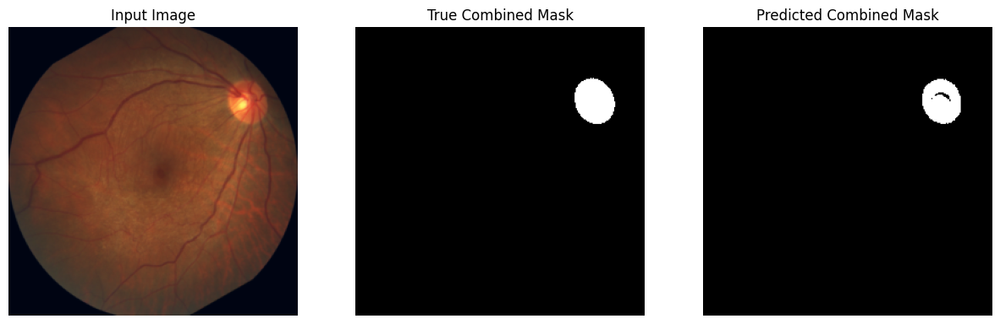

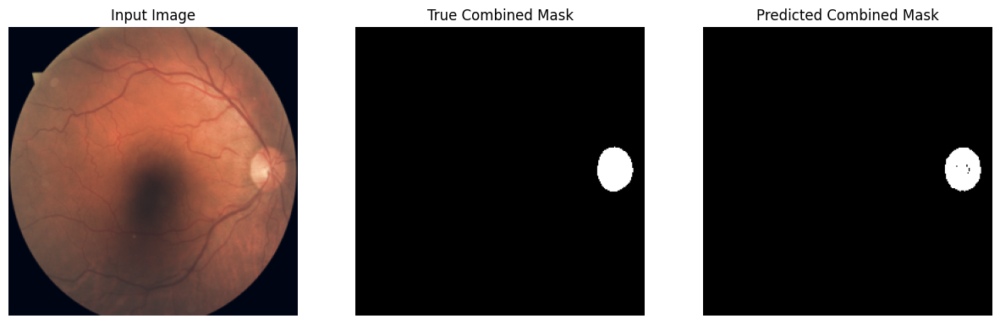

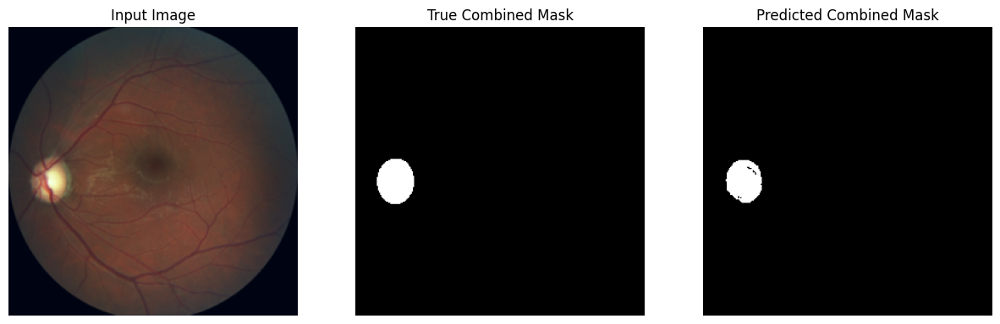

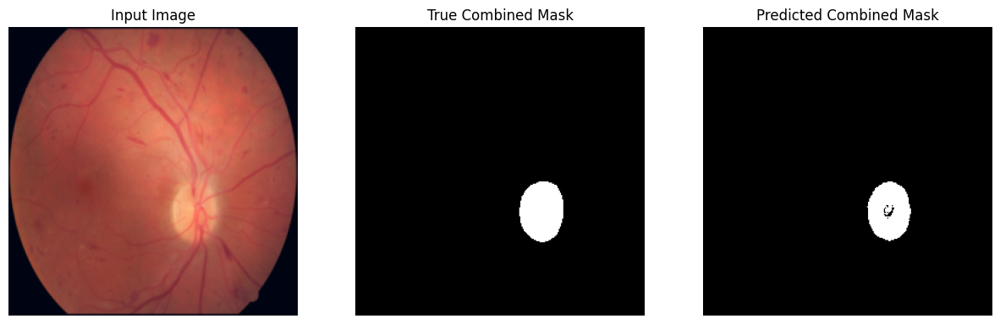

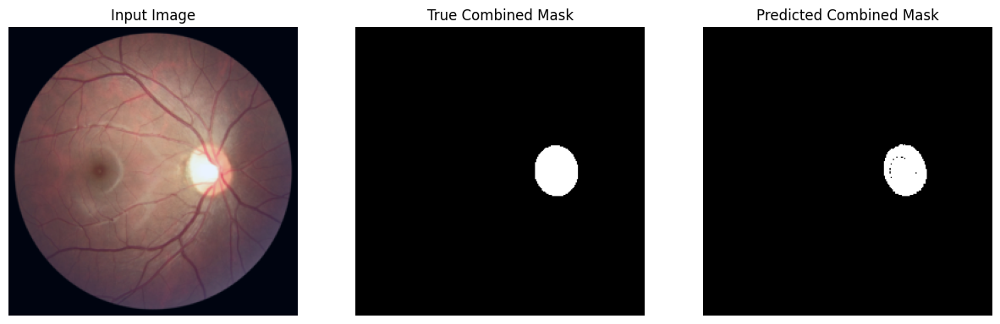

...

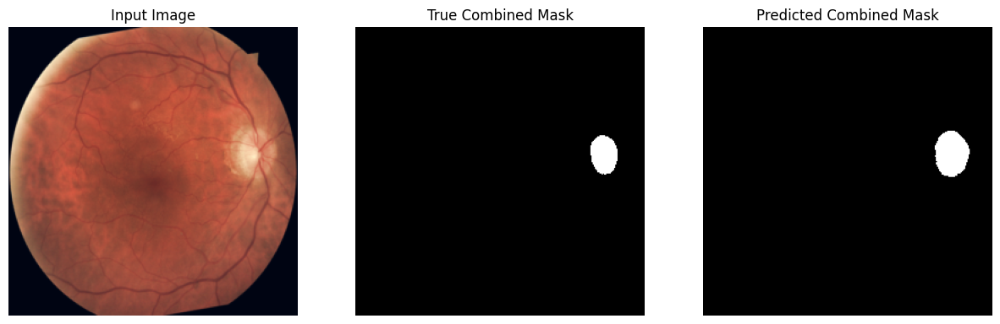

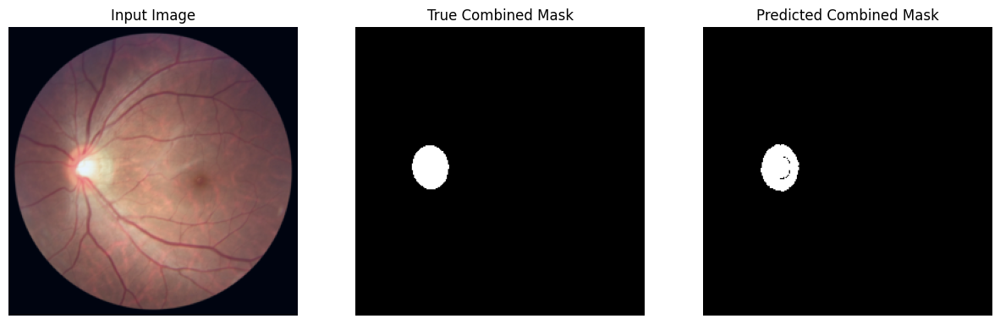

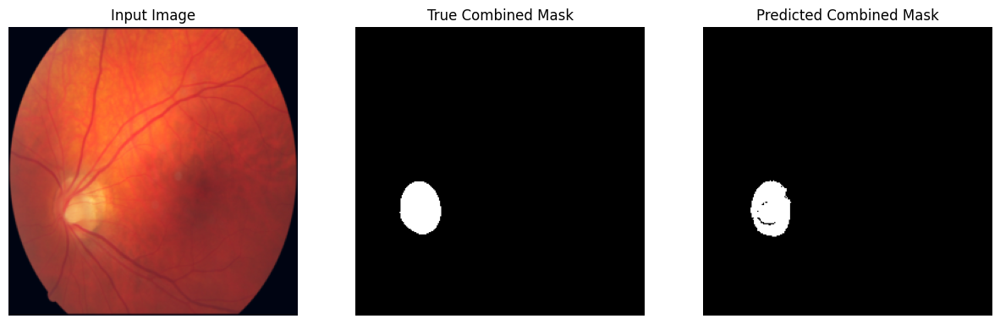

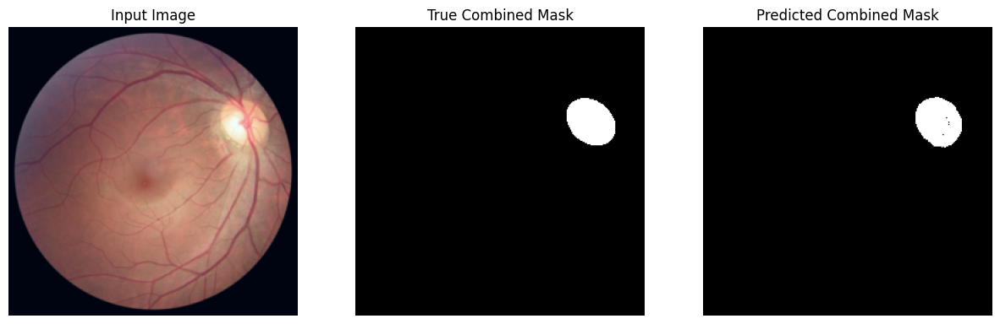

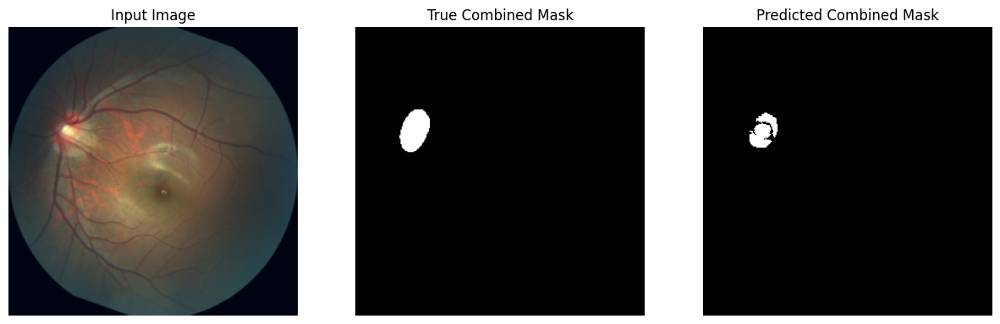

Average Dice Coefficient for Combined OD and OC: 0.9286


In [52]:
import torch
import matplotlib.pyplot as plt

class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice
def test_and_visualize_combined(models, test_loader, device):
    model_od, model_oc = models
    model_od.eval()
    model_oc.eval()

    total_dice = 0.0
    count = 0
    dice_scorer = DiceScoreCoefficient().to(device)

    for images, masks_od, masks_oc in test_loader:
        images = images.to(device)
        masks_od = masks_od.to(device)
        masks_oc = masks_oc.to(device)

        with torch.no_grad():
            outputs_od = model_od(images).argmax(dim=1)
            outputs_oc = model_oc(images).argmax(dim=1)

            # Combine OD and OC predictions into one binary mask
            combined_outputs = (outputs_od | outputs_oc).float()
            combined_masks = (masks_od | masks_oc).float()  # Consider OD and OC as one class in the true mask

            dice_score = dice_scorer(combined_outputs, combined_masks)
            total_dice += dice_score.item()
            count += 1

            if count <= 2:  # Visualize the first 2 batches
                visualize_combined(images, combined_masks, combined_outputs)

    average_dice = total_dice / count
    print(f'Average Dice Coefficient for Combined OD and OC: {average_dice:.4f}')

def visualize_combined(images, true_masks, pred_masks):
    for i in range(images.size(0)):
        image_np = images[i].cpu().numpy().transpose(1, 2, 0)
        image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
        true_mask_np = true_masks[i].cpu().numpy()
        pred_mask_np = pred_masks[i].cpu().numpy()

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(image_np)
        plt.title('Input Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(true_mask_np, cmap='gray')
        plt.title('True Combined Mask')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask_np, cmap='gray')
        plt.title('Predicted Combined Mask')
        plt.axis('off')
        plt.show()

# Configuration and model loading
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_od = UNet(n_channels=3, n_classes=2).to(device)
model_oc = UNet(n_channels=3, n_classes=2).to(device)

model_od.load_state_dict(torch.load('best_model_od.pth', map_location=device))
model_oc.load_state_dict(torch.load('best_model_oc.pth', map_location=device))

# Test and visualize
test_and_visualize_combined((model_od, model_oc), test_loader, device)


###Extra Credit trying different optimizer on the best model out of the above, which OD and OC was trained as a single class

---



In [4]:

# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=3, n_classes=2).to(device)


# Changed to Adam
optimizer = optim.Adam(model.parameters(), lr=0.01, betas=(0.9, 0.999), eps=1e-08)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2,factor=0.1)
criterion = nn.CrossEntropyLoss().to(device)
num_epochs = 200
best_dice_score = 0.0
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
print('training started...')
# Training and validation loop
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_dice_score = validate_model(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Early stopping
    if val_dice_score > best_dice_score:
        best_dice_score = val_dice_score
        best_loss = val_loss
        torch.save(model.state_dict(), 'Adam_best_model.pth')
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f} (improved)")
        patience_counter = 0
    else:
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f}")
        patience_counter += 1

    if patience_counter >= patience:
            print("Early stopping triggered due to no improvement in validation dice score.")
            break

training started...
Epoch 1: Training Loss 0.056988, Validation Loss 0.048159, Dice Score 0.299723 (improved)
Epoch 2: Training Loss 0.042891, Validation Loss 0.035562, Dice Score 0.558173 (improved)
Epoch 3: Training Loss 0.029209, Validation Loss 0.040661, Dice Score 0.715339 (improved)
Epoch 4: Training Loss 0.023236, Validation Loss 0.037152, Dice Score 0.610864
Epoch 5: Training Loss 0.020844, Validation Loss 0.019473, Dice Score 0.812705 (improved)
Epoch 6: Training Loss 0.018741, Validation Loss 0.024664, Dice Score 0.784201
Epoch 7: Training Loss 0.016637, Validation Loss 0.017685, Dice Score 0.821618 (improved)
Epoch 8: Training Loss 0.014811, Validation Loss 0.018428, Dice Score 0.763415
Epoch 9: Training Loss 0.013330, Validation Loss 0.019542, Dice Score 0.736122
Epoch 10: Training Loss 0.012164, Validation Loss 0.011366, Dice Score 0.877661 (improved)
Epoch 11: Training Loss 0.011644, Validation Loss 0.013260, Dice Score 0.858829
Epoch 12: Training Loss 0.011350, Validatio

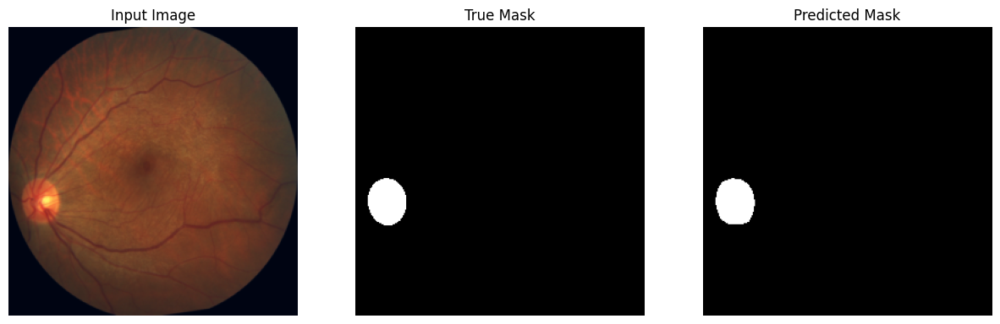

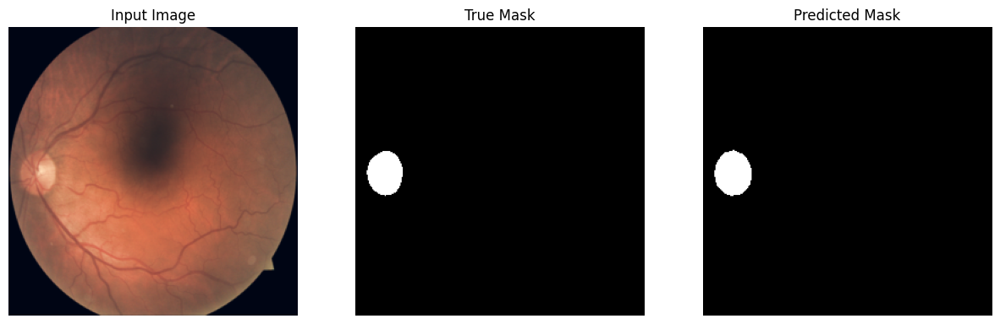

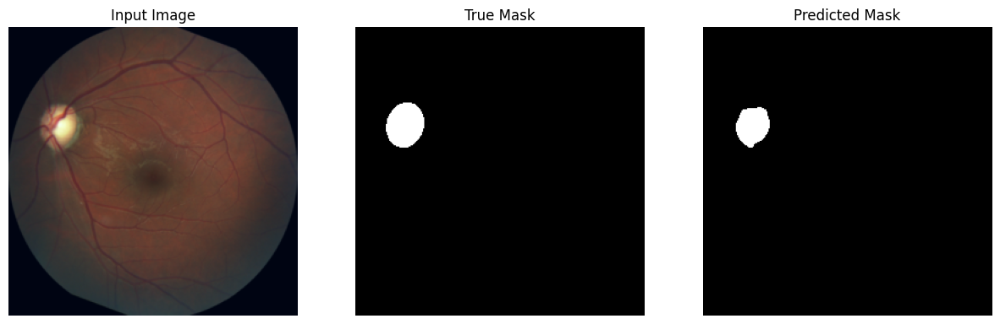

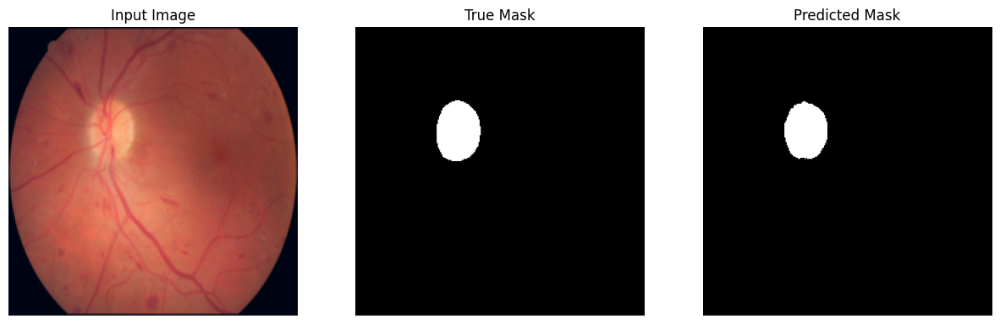

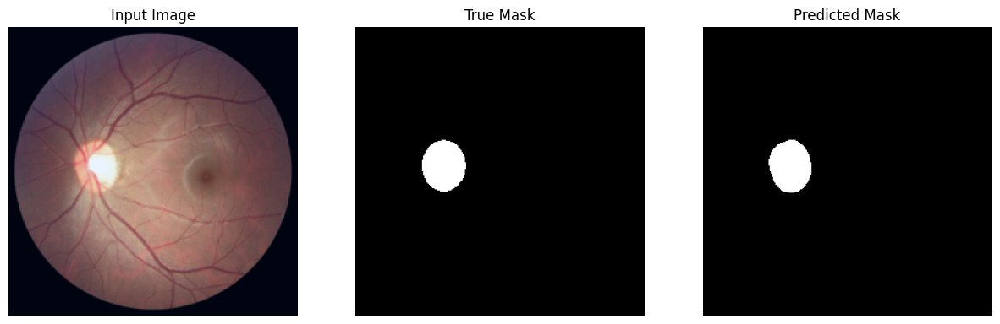

...

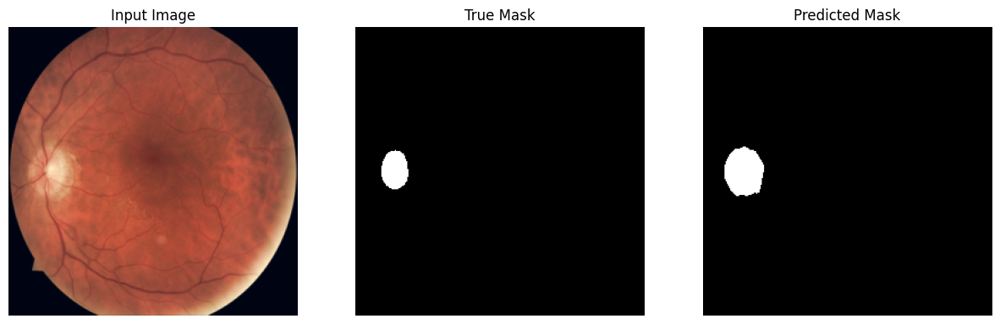

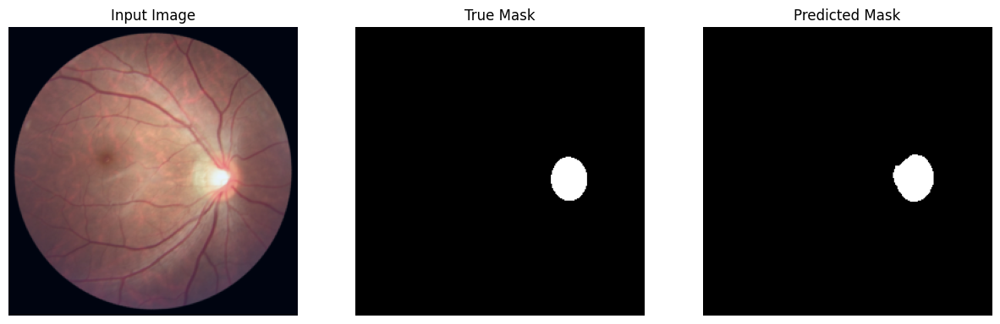

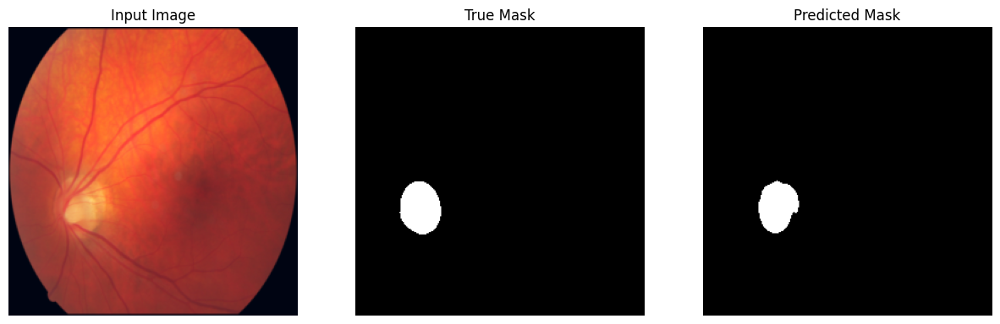

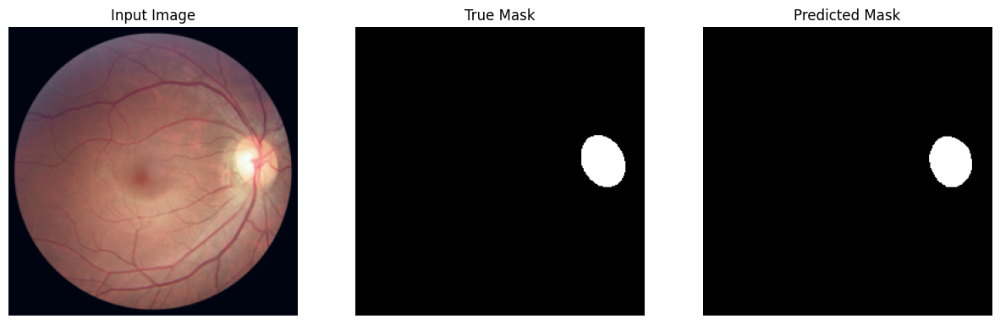

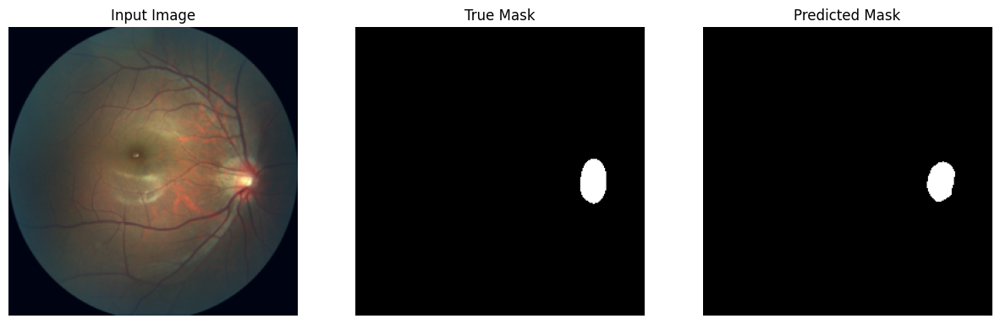

Average Dice Coefficient: 0.9193


In [6]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F

class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice

def visualize(image, mask, prediction):
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
    mask_np = mask.cpu().numpy()
    prediction_np = prediction.cpu().numpy()
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title('True Mask')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(prediction_np, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Initialize the model
model = UNet(n_channels=3, n_classes=2)
model_load_path = 'Adam_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
model.eval()
model = model.to(device)

dice_scorer = DiceScoreCoefficient().to(device)
total_dice_coefficient = 0.0
count = 0

for images, masks in test_loader:
    images = images.to(device)
    masks = masks.to(device)
    masks = (masks).float()  # Combine OC and OD into one class

    with torch.no_grad():
        outputs = model(images)
        probabilities = F.softmax(outputs, dim=1)
        preds = probabilities.argmax(dim=1)
        preds = (preds).float()  # Convert to binary predictions

        dice_coef = dice_scorer(preds, masks)
        total_dice_coefficient += dice_coef.item()
        count += 1

        if count in [1, 2]:  # Visualize the first 2 batches
            for i in range(images.size(0)):
                visualize(images[i], masks[i], preds[i])

if count > 0:
    average_dice = total_dice_coefficient / count
    print(f'Average Dice Coefficient: {average_dice:.4f}')
else:
    print("No data to process.")


###Extra credit: trying another optimizer RMSprop

---





In [7]:

# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=3, n_classes=2).to(device)

# Optimizer using RMSprop
optimizer = optim.RMSprop(model.parameters(), lr=0.01, alpha=0.9, eps=1e-08, weight_decay=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2,factor=0.1)
criterion = nn.CrossEntropyLoss().to(device)
num_epochs = 200
best_dice_score = 0.0
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
print('training started...')
# Training and validation loop
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_dice_score = validate_model(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Early stopping
    if val_dice_score > best_dice_score:
        best_dice_score = val_dice_score
        best_loss = val_loss
        torch.save(model.state_dict(), 'RMSprop_best_model.pth')
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f} (improved)")
        patience_counter = 0
    else:
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f}")
        patience_counter += 1

    if patience_counter >= patience:
            print("Early stopping triggered due to no improvement in validation dice score.")
            break

training started...
Epoch 1: Training Loss 0.080122, Validation Loss 0.126211, Dice Score 0.000104 (improved)
Epoch 2: Training Loss 0.067828, Validation Loss 0.067655, Dice Score 0.435115 (improved)
Epoch 3: Training Loss 0.067771, Validation Loss 0.084160, Dice Score 0.000104
Epoch 4: Training Loss 0.068986, Validation Loss 5.926842, Dice Score 0.036434
Epoch 5: Training Loss 0.067736, Validation Loss 0.085912, Dice Score 0.000104
Epoch 6: Training Loss 0.056150, Validation Loss 0.091715, Dice Score 0.491379 (improved)
Epoch 7: Training Loss 0.054405, Validation Loss 0.073596, Dice Score 0.000104
Epoch 8: Training Loss 0.055836, Validation Loss 0.098324, Dice Score 0.472893
Epoch 9: Training Loss 0.052365, Validation Loss 0.051180, Dice Score 0.549037 (improved)
Epoch 10: Training Loss 0.049030, Validation Loss 0.047897, Dice Score 0.483501
Epoch 11: Training Loss 0.045693, Validation Loss 0.048537, Dice Score 0.505809
Epoch 12: Training Loss 0.043575, Validation Loss 0.043187, Dice 

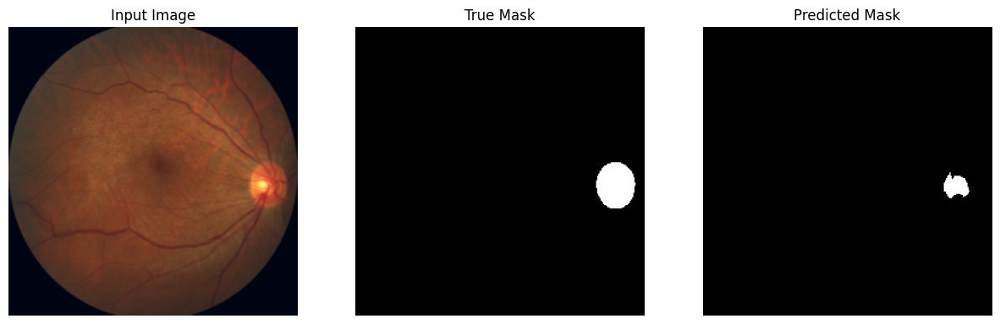

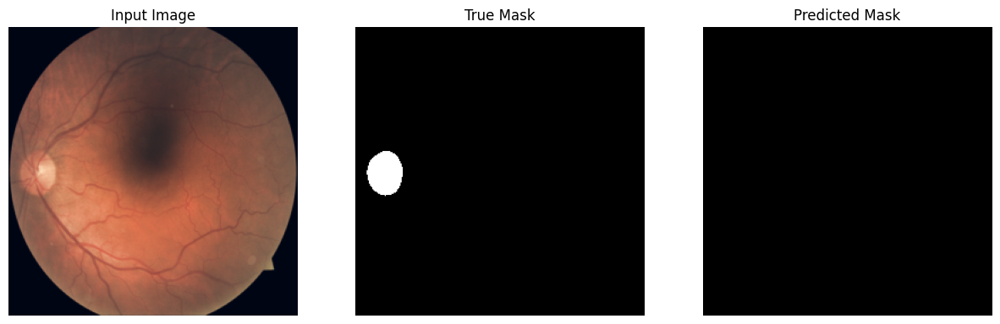

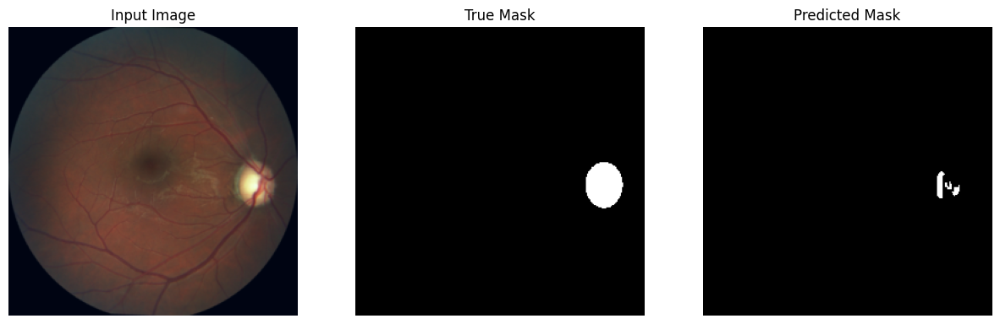

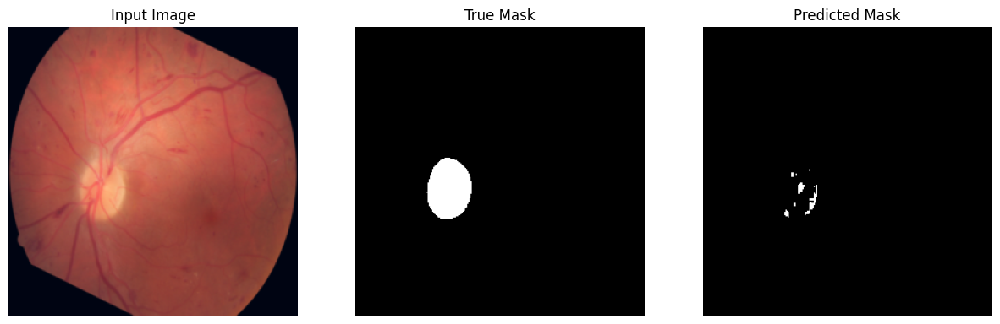

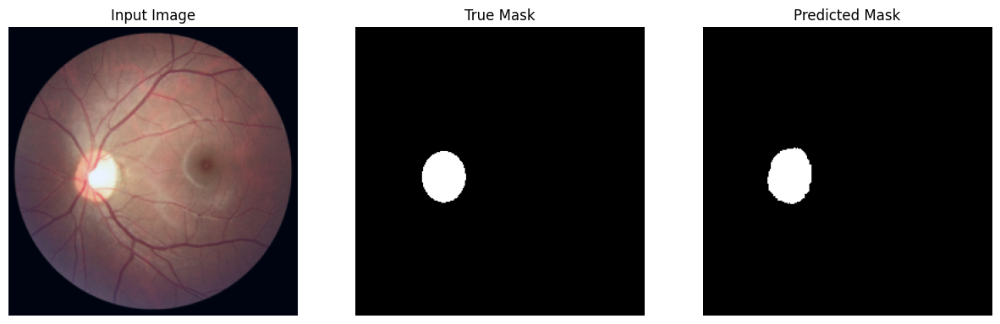

...

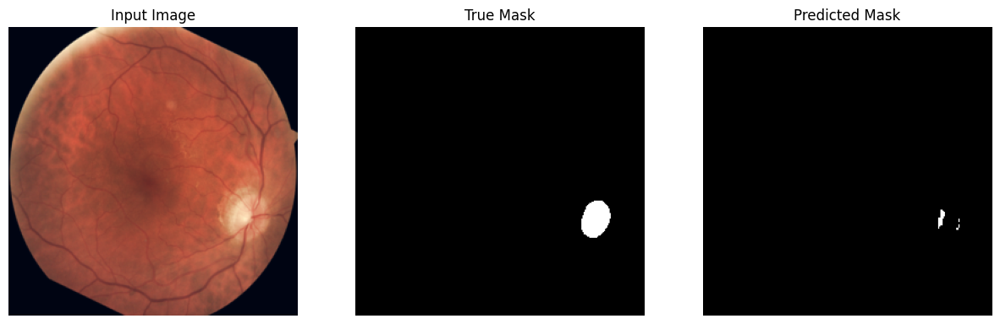

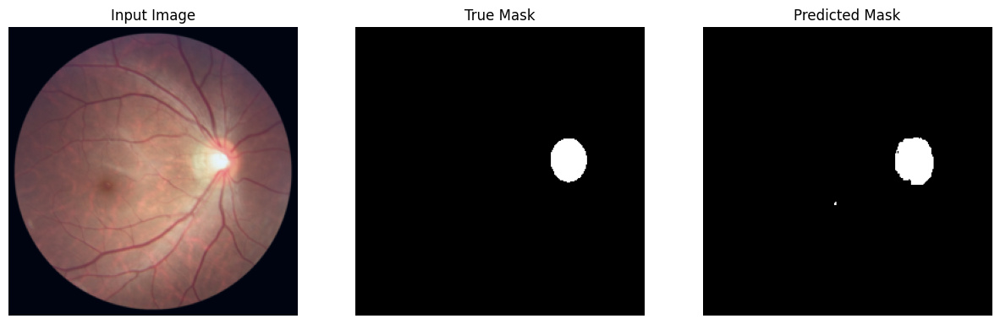

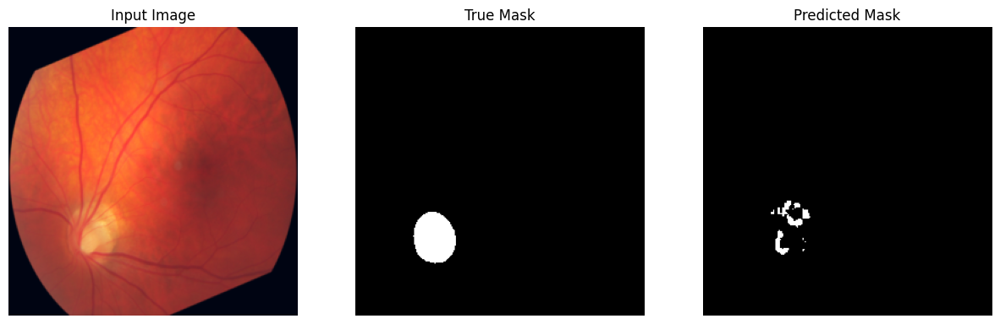

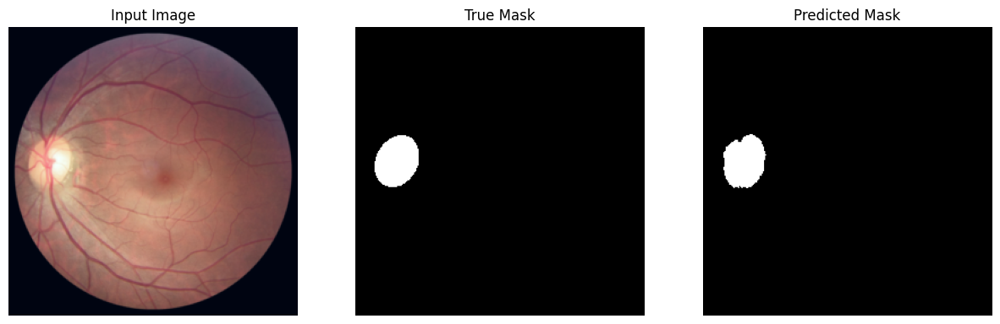

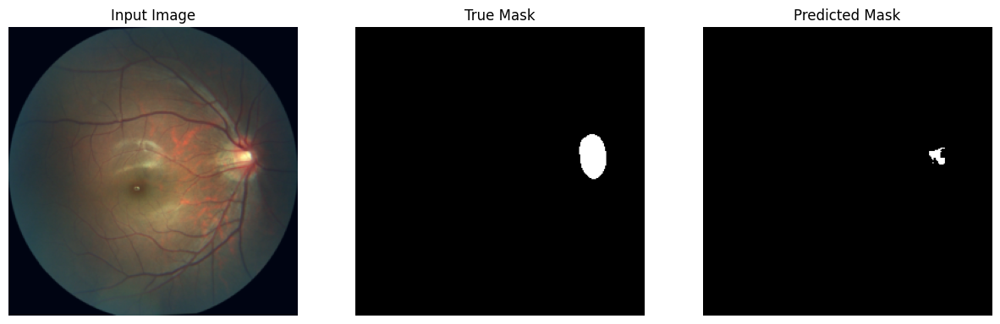

Average Dice Coefficient: 0.6567


In [8]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F


class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice

def visualize(image, mask, prediction):
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
    mask_np = mask.cpu().numpy()
    prediction_np = prediction.cpu().numpy()
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title('True Mask')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(prediction_np, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Initialize the model
model = UNet(n_channels=3, n_classes=2)
model_load_path = 'RMSprop_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
model.eval()
model = model.to(device)

dice_scorer = DiceScoreCoefficient().to(device)
total_dice_coefficient = 0.0
count = 0

for images, masks in test_loader:
    images = images.to(device)
    masks = masks.to(device)
    masks = (masks).float()  # Combine OC and OD into one class

    with torch.no_grad():
        outputs = model(images)
        probabilities = F.softmax(outputs, dim=1)
        preds = probabilities.argmax(dim=1)
        preds = (preds).float()  # Convert to binary predictions

        dice_coef = dice_scorer(preds, masks)
        total_dice_coefficient += dice_coef.item()
        count += 1

        if count in [1, 2]:  # Visualize the first 2 batches
            for i in range(images.size(0)):
                visualize(images[i], masks[i], preds[i])

if count > 0:
    average_dice = total_dice_coefficient / count
    print(f'Average Dice Coefficient: {average_dice:.4f}')
else:
    print("No data to process.")


###Extra Credit: Trying different loss which is combined dice score loss with Cross-entropy along with the best optimizer which is SGD (Best)

---



In [ ]:
# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=3, n_classes=2).to(device)

# SGD optimizer and a learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2,factor=0.1)
criterion = CombinedDiceCELoss().to(device)
num_epochs = 200
best_dice_score = 0.0
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
print('training started...')
# Training and validation loop
model_load_path = 'Dice_score_loss_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
for epoch in range(9, num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_dice_score = validate_model(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Early stopping
    if val_dice_score > best_dice_score:
        best_dice_score = val_dice_score
        best_loss = val_loss
        torch.save(model.state_dict(), 'Dice_score_loss_best_model.pth')
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f} (improved)")
        patience_counter = 0
    else:
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f}")
        patience_counter += 1

    if patience_counter >= patience:
            print("Early stopping triggered due to no improvement in validation dice score.")
            break

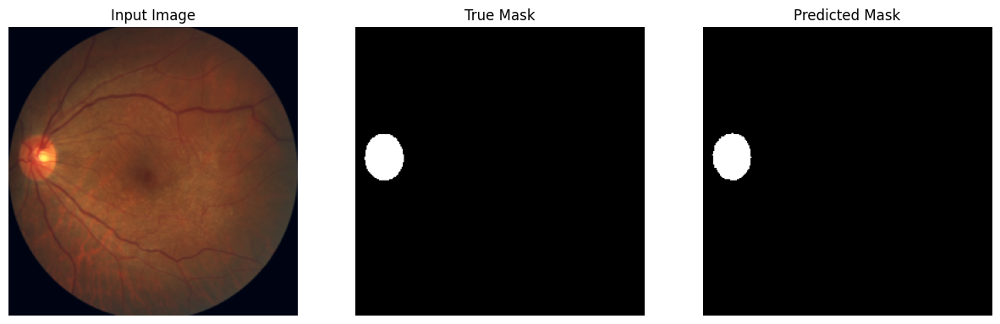

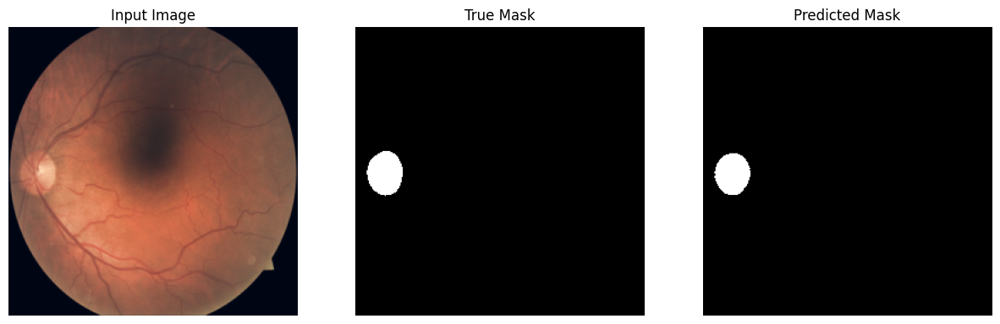

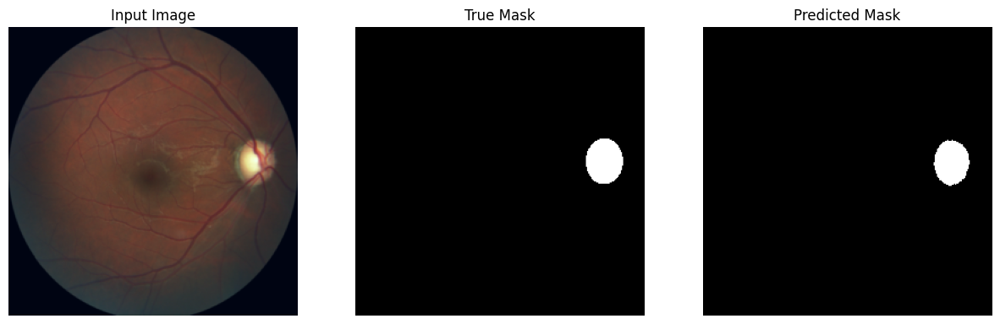

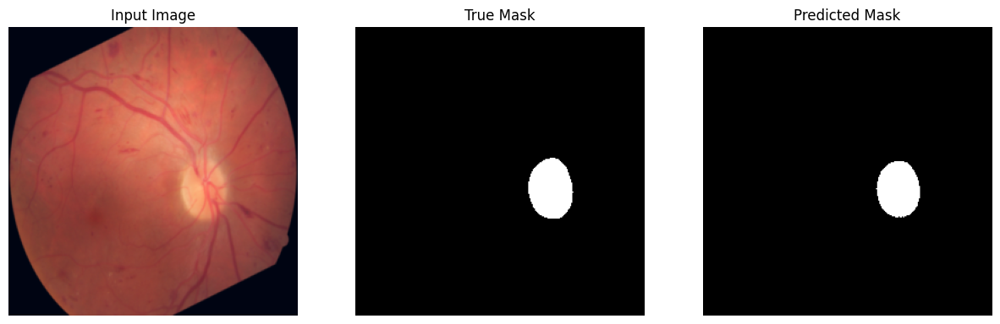

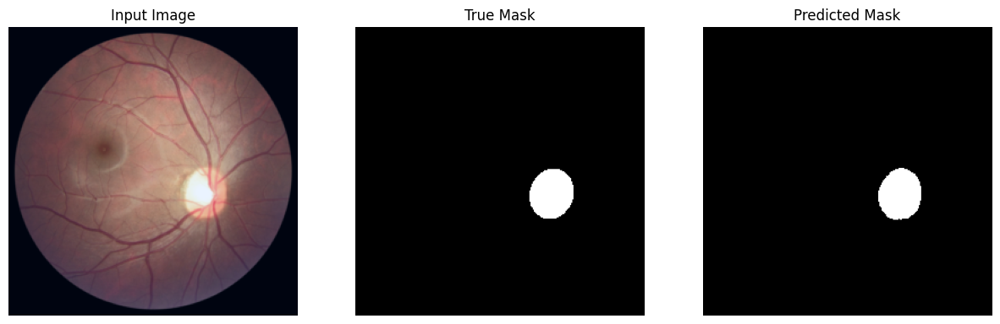

...

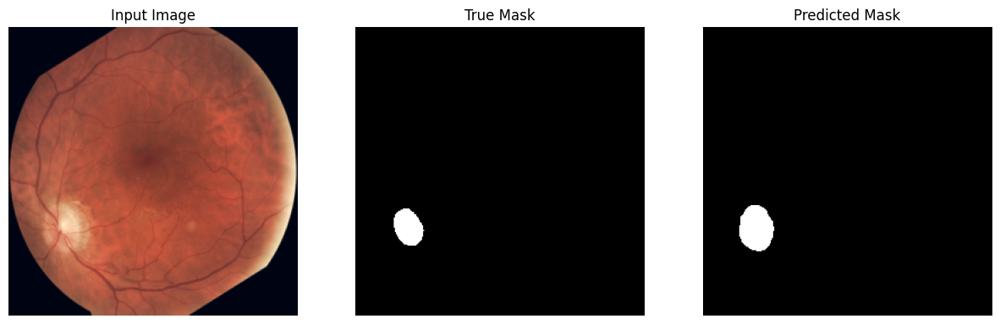

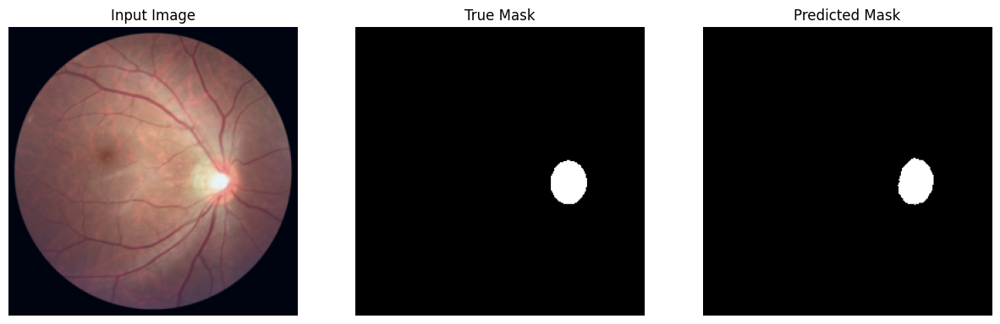

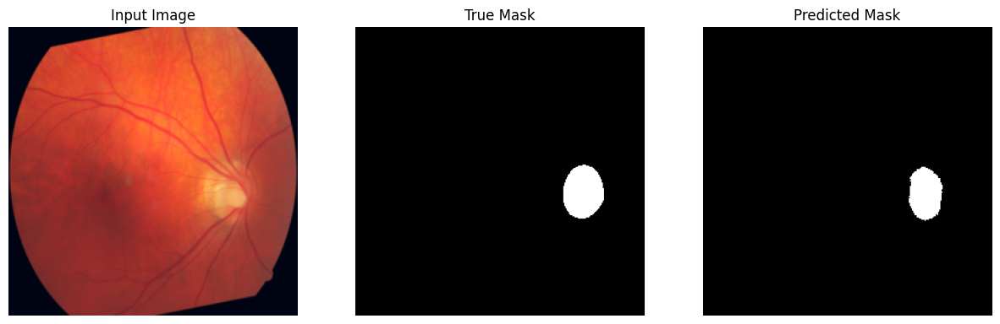

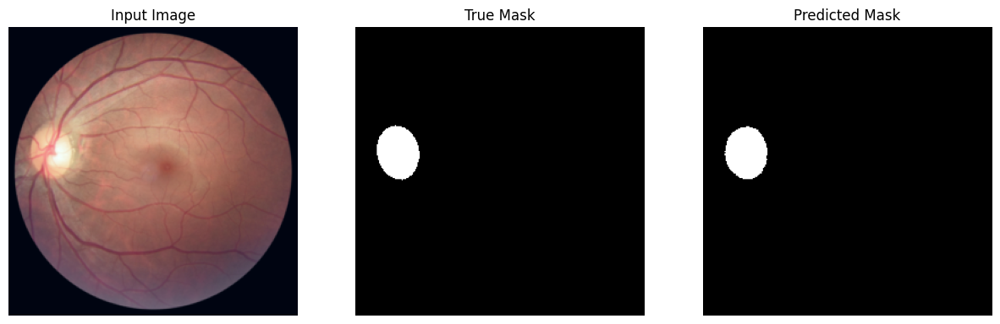

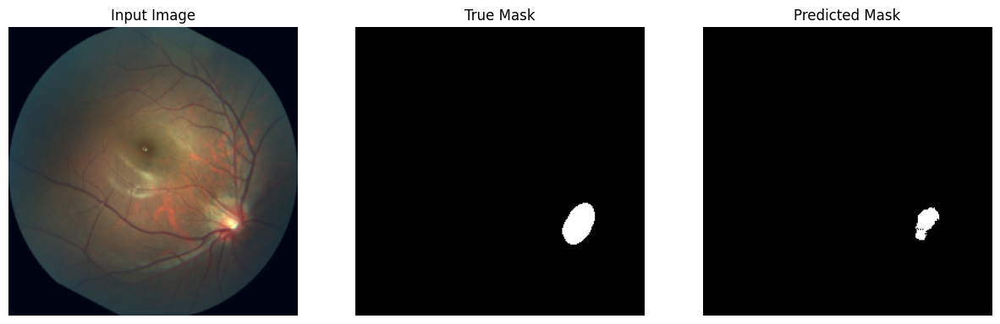

Average Dice Coefficient: 0.9426


In [6]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F


class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice

def visualize(image, mask, prediction):
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
    mask_np = mask.cpu().numpy()
    prediction_np = prediction.cpu().numpy()
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title('True Mask')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(prediction_np, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Initialize the model
model = UNet(n_channels=3, n_classes=2)
model_load_path = 'Dice_score_loss_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
model.eval()
model = model.to(device)

dice_scorer = DiceScoreCoefficient().to(device)
total_dice_coefficient = 0.0
count = 0

for images, masks in test_loader:
    images = images.to(device)
    masks = masks.to(device)
    masks = (masks).float()  # Combine OC and OD into one class

    with torch.no_grad():
        outputs = model(images)
        probabilities = F.softmax(outputs, dim=1)
        preds = probabilities.argmax(dim=1)
        preds = (preds).float()  # Convert to binary predictions

        dice_coef = dice_scorer(preds, masks)
        total_dice_coefficient += dice_coef.item()
        count += 1

        if count in [1, 2]:  # Visualize the first 2 batches
            for i in range(images.size(0)):
                visualize(images[i], masks[i], preds[i])

if count > 0:
    average_dice = total_dice_coefficient / count
    print(f'Average Dice Coefficient: {average_dice:.4f}')
else:
    print("No data to process.")


###Applying other type of loss which is focal loss it is known to work well with medical images segmentations since it focuses more on hard to classify data and less on the well classified ones

In [7]:
# new loss class Focal Loss
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ce_loss = nn.CrossEntropyLoss(reduction='none')

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * ce_loss).mean()
        return focal_loss
# use GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(n_channels=3, n_classes=2).to(device)

# SGD optimizer and a learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2,factor=0.1)
criterion = FocalLoss().to(device)
num_epochs = 200
best_dice_score = 0.0
patience = 6
patience_counter = 0

# Initialize model weights
#model.apply(init_weights)
best_dice_score = 0.0
best_loss = float('inf')
model_load_path = 'FocalLoss_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
print('training started...')
# Training and validation loop
for epoch in range(24,num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_dice_score = validate_model(model, val_loader, criterion, device)
    scheduler.step(val_loss)

    # Early stopping
    if val_dice_score > best_dice_score:
        best_dice_score = val_dice_score
        best_loss = val_loss
        torch.save(model.state_dict(), 'FocalLoss_best_model.pth')
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f} (improved)")
        patience_counter = 0
    else:
        print(f"Epoch {epoch+1}: Training Loss {train_loss:f}, Validation Loss {val_loss:f}, Dice Score {val_dice_score:f}")
        patience_counter += 1

    if patience_counter >= patience:
            print("Early stopping triggered due to no improvement in validation dice score.")
            break

training started...
Epoch 25: Training Loss 0.000521, Validation Loss 0.000556, Dice Score 0.915288 (improved)
Epoch 26: Training Loss 0.000495, Validation Loss 0.000568, Dice Score 0.911306
Epoch 27: Training Loss 0.000502, Validation Loss 0.000564, Dice Score 0.914513
Epoch 28: Training Loss 0.000484, Validation Loss 0.000539, Dice Score 0.915763 (improved)
Epoch 29: Training Loss 0.000483, Validation Loss 0.000546, Dice Score 0.917249 (improved)
Epoch 30: Training Loss 0.000481, Validation Loss 0.000597, Dice Score 0.905323
Epoch 31: Training Loss 0.000466, Validation Loss 0.000550, Dice Score 0.915172
Epoch 32: Training Loss 0.000456, Validation Loss 0.000525, Dice Score 0.917378 (improved)
Epoch 33: Training Loss 0.000455, Validation Loss 0.000500, Dice Score 0.921429 (improved)
Epoch 34: Training Loss 0.000446, Validation Loss 0.000504, Dice Score 0.921106
Epoch 35: Training Loss 0.000449, Validation Loss 0.000509, Dice Score 0.919742
Epoch 36: Training Loss 0.000436, Validation 

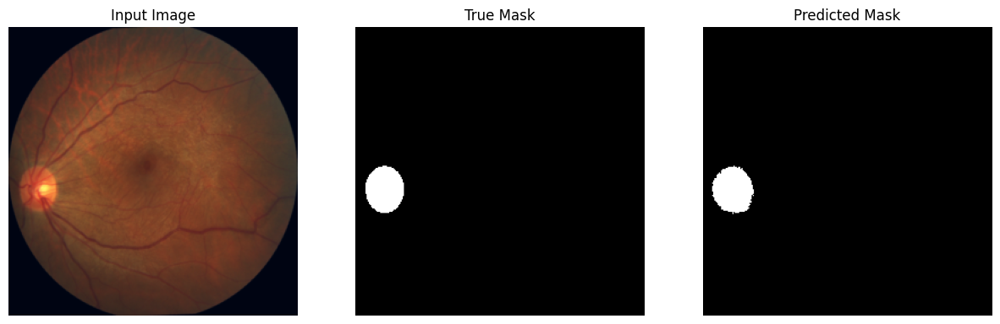

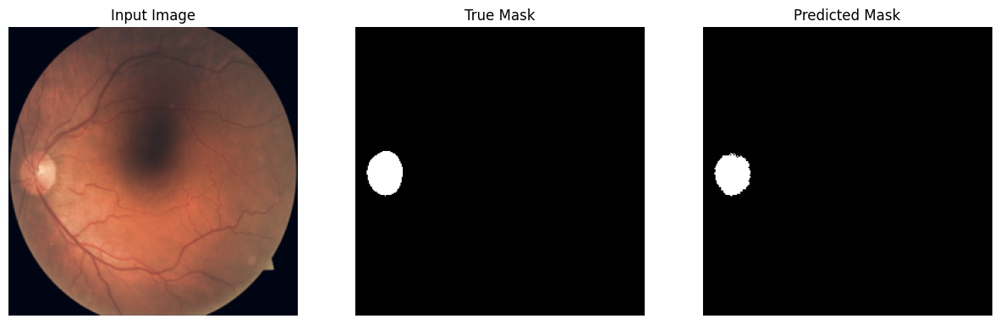

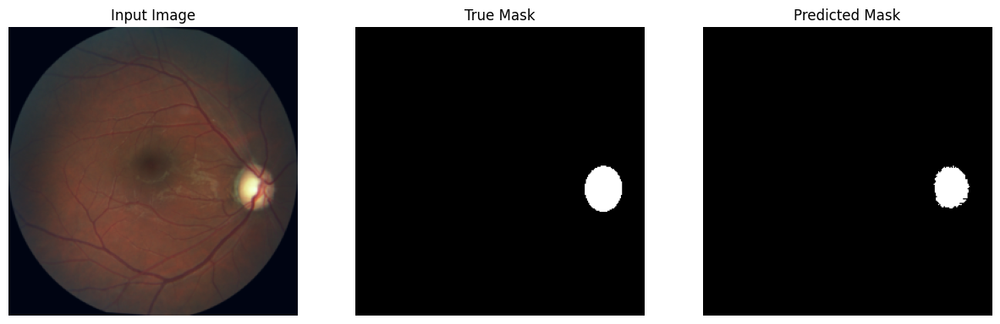

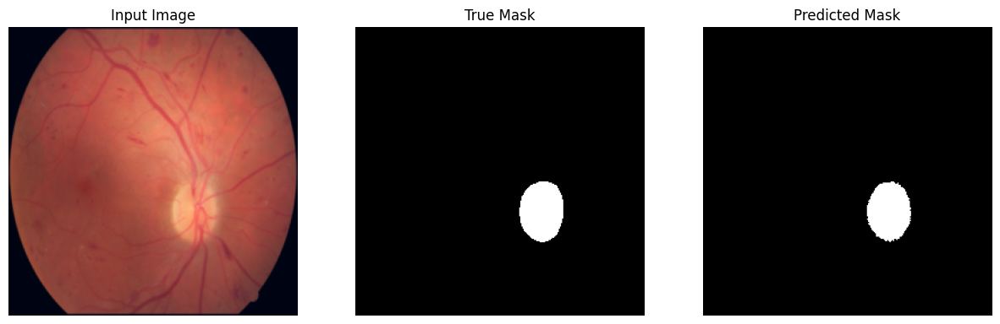

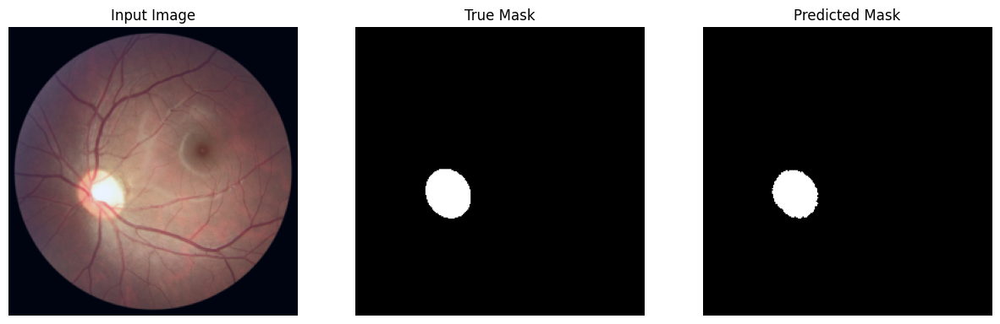

...

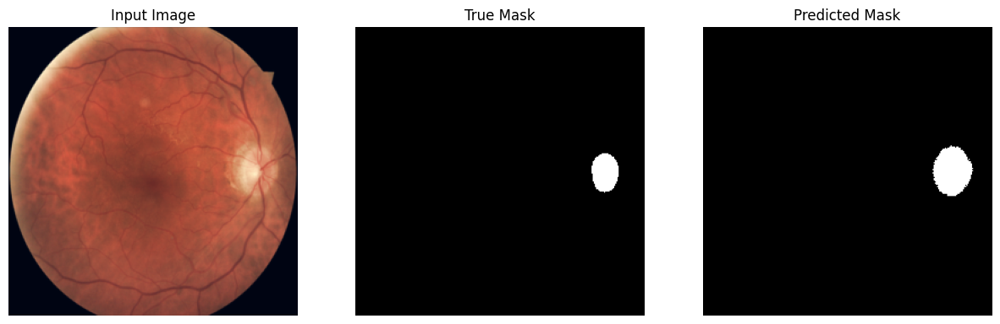

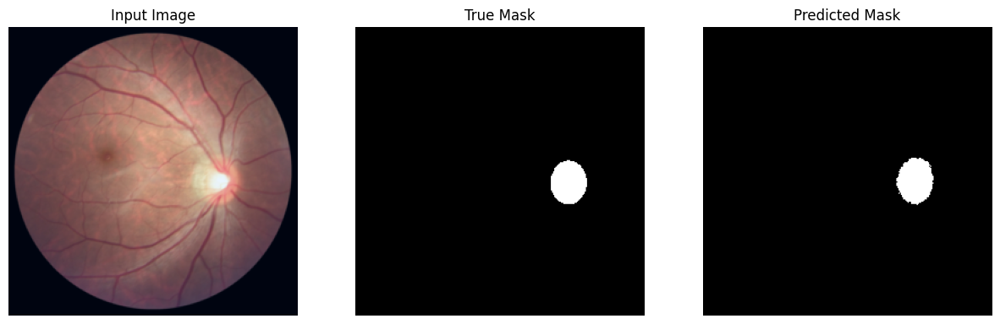

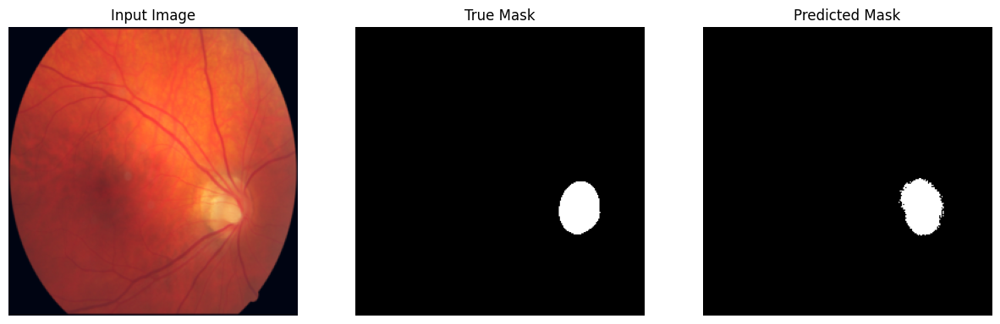

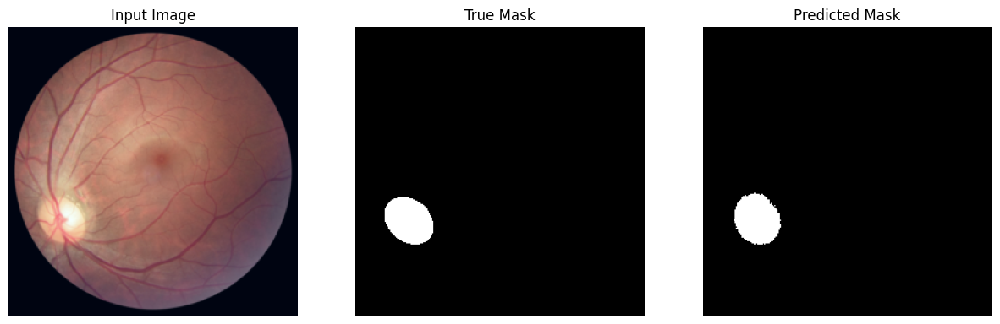

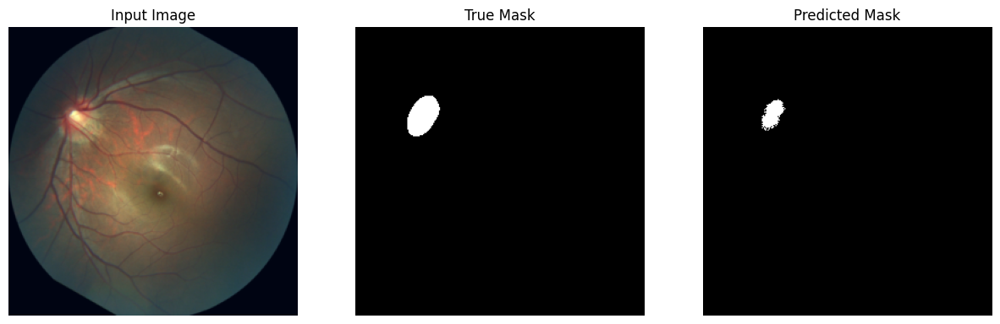

Average Dice Coefficient: 0.9221


In [9]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F


class DiceScoreCoefficient(nn.Module):
    def forward(self, inputs, targets):
        smooth = 1.0
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return dice

def visualize(image, mask, prediction):
    image_np = image.cpu().numpy().transpose(1, 2, 0)
    image_np = (image_np - np.min(image_np)) / (np.max(image_np) - np.min(image_np))
    mask_np = mask.cpu().numpy()
    prediction_np = prediction.cpu().numpy()
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title('Input Image')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title('True Mask')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(prediction_np, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Initialize the model
model = UNet(n_channels=3, n_classes=2)
model_load_path = 'FocalLoss_best_model.pth'
model.load_state_dict(torch.load(model_load_path, map_location=device))
model.eval()
model = model.to(device)

dice_scorer = DiceScoreCoefficient().to(device)
total_dice_coefficient = 0.0
count = 0

for images, masks in test_loader:
    images = images.to(device)
    masks = masks.to(device)
    masks = (masks).float()  # Combine OC and OD into one class

    with torch.no_grad():
        outputs = model(images)
        probabilities = F.softmax(outputs, dim=1)
        preds = probabilities.argmax(dim=1)
        preds = (preds).float()  # Convert to binary predictions

        dice_coef = dice_scorer(preds, masks)
        total_dice_coefficient += dice_coef.item()
        count += 1

        if count in [1, 2]:  # Visualize the first 2 batches
            for i in range(images.size(0)):
                visualize(images[i], masks[i], preds[i])

if count > 0:
    average_dice = total_dice_coefficient / count
    print(f'Average Dice Coefficient: {average_dice:.4f}')
else:
    print("No data to process.")
